In [1]:
import re
import linecache         as lc
import matplotlib.pyplot as plt
import numpy             as np
import pandas            as pd

from astropy.io               import fits
from astropy.wcs              import WCS
from astropy.visualization    import ZScaleInterval
from kapteyn                  import kmpfit
from matplotlib.ticker        import MultipleLocator, FormatStrFormatter

from global_functions_library import plot_image, make_mask_and_compute_background_statistics, do_aperture_photometric_by_radius, compute_instrumental_magnitude_and_error, color_term_fitting, residual_function, color_term_fitting_error

In [2]:
def FIND_SS_FROM_SEXTRACTOR_CATALOG(filter: str, object_name: str, object_center_pos_pixel: np.array, standard_star_circle_radius: np.float64, object_circle_radius: np.float64) -> tuple :
    source_sex_catalog     = "./SEXTRACTOR_CATALOG/detected_sources_%s_%s_band.cat"%(object_name,filter)
    skip_row_num           = 20
    column_dict            = {}
    column_namelist        = []

    for row_num in range(1, skip_row_num+1):
        column_dict[np.int32(lc.getline(source_sex_catalog, row_num).split()[1])] = lc.getline(source_sex_catalog , row_num).split()[2] # read the column information

    data_frame_source_sex  = pd.read_csv(source_sex_catalog, skiprows=skip_row_num, delimiter="\s+", header=None)

    for column_num in range(1, data_frame_source_sex.shape[1]+1):
        try:    column_namelist.append(column_dict[column_num])
        except: column_namelist.append("NONE")
    data_frame_source_sex.columns = column_namelist

    star_sex_criteria   = 0.5
    star_sex_filter     = (data_frame_source_sex["CLASS_STAR"]>star_sex_criteria)

    star_sex_pixel_x    = data_frame_source_sex["X_IMAGE"][star_sex_filter]
    star_sex_pixel_y    = data_frame_source_sex["Y_IMAGE"][star_sex_filter]
    star_sex_index      = data_frame_source_sex["NUMBER"] [star_sex_filter]

    star_sex_pos_filter = (((star_sex_pixel_x-object_center_pos_pixel[0])**2. + (star_sex_pixel_y-object_center_pos_pixel[1])**2.)**0.5 <= standard_star_circle_radius) &\
                        (((star_sex_pixel_x-object_center_pos_pixel[0])**2. + (star_sex_pixel_y-object_center_pos_pixel[1])**2.)**0.5 >  object_circle_radius)
    star_sex_pixel_x    = star_sex_pixel_x[star_sex_pos_filter]
    star_sex_pixel_y    = star_sex_pixel_y[star_sex_pos_filter]
    star_sex_index      = star_sex_index  [star_sex_pos_filter]
    data_frame_final    = data_frame_source_sex[star_sex_filter][star_sex_pos_filter]
    return data_frame_final, star_sex_pixel_x, star_sex_pixel_y

In [3]:
import astropy
import pandas

def LOAD_APASS_CATALOG() -> tuple: 
    source_apass_catalog    = "./apass_344.49737_0.29520_0.55.csv"
    data_frame_source_apass = pd.read_csv(source_apass_catalog, skiprows=0, delimiter=",", header=0, index_col=None)

    star_apass_world_ra      = data_frame_source_apass["radeg" ]
    star_apass_world_dec     = data_frame_source_apass["decdeg"]
    star_apass_index         = data_frame_source_apass.index.values
    star_apass_world_coord    = np.concatenate((star_apass_world_ra.values.reshape(-1,1), star_apass_world_dec.values.reshape(-1,1)), axis=1)
    return data_frame_source_apass, star_apass_index, star_apass_world_coord

def FIND_SS_FROM_APASS_CATALOG(star_apass_index: pandas.core.indexes.range.RangeIndex, star_apass_world_coord: np.array, imag_data: np.array, wcs: astropy.wcs.wcs.WCS, object_center_pos_pixel: np.array, standard_star_circle_radius: np.float64, object_circle_radius: np.float64) -> tuple:
    left_edge_world           = wcs.all_pix2world([[0,0]], 0)[0]
    right_edge_world          = wcs.all_pix2world([[imag_data.shape[1],imag_data.shape[0]]], 0)[0]
    star_apass_world_ra       = star_apass_world_coord[:,0]
    star_apass_world_dec      = star_apass_world_coord[:,1]
    star_apass_filter         =   (star_apass_world_ra >left_edge_world[0]) & (star_apass_world_ra <right_edge_world[0]) & \
                                  (star_apass_world_dec<left_edge_world[1]) & (star_apass_world_dec>right_edge_world[1])  # left_edge_ra < right_edge_ra ; left_edge_dec > right_edge_dec

    star_apass_pixel_coord    = wcs.all_world2pix(star_apass_world_coord[star_apass_filter], 0)
    star_apass_pixel_x        = star_apass_pixel_coord[:,0]
    star_apass_pixel_y        = star_apass_pixel_coord[:,1]
    star_apass_index          = star_apass_index[star_apass_filter]
    
    star_apass_pos_filter     = (((star_apass_pixel_x-object_center_pos_pixel[0])**2. + (star_apass_pixel_y-object_center_pos_pixel[1])**2.)**0.5 <= standard_star_circle_radius) &\
                            (((star_apass_pixel_x-object_center_pos_pixel[0])**2. + (star_apass_pixel_y-object_center_pos_pixel[1])**2.)**0.5 >  object_circle_radius)
    
    star_apass_index_filtered = star_apass_index[star_apass_pos_filter]
    star_apass_pixel_x        = pd.Series(star_apass_pixel_x[star_apass_pos_filter], index=star_apass_index_filtered)
    star_apass_pixel_y        = pd.Series(star_apass_pixel_y[star_apass_pos_filter], index=star_apass_index_filtered)
    
    return star_apass_index_filtered, star_apass_pixel_x, star_apass_pixel_y

In [4]:
file_path_dict = {"B": "/home/koarakawaii/Lecture_Code/Advanced_Astronomical_Observation/Term_Project/image_processing/FITS_SDSS_Elliptical_Galaxy/SDSS2258+0017_corrected/B/plate_solving/SDSS2258+0017_B_8min_stacked_plate_solved.fit",
                  "V": "/home/koarakawaii/Lecture_Code/Advanced_Astronomical_Observation/Term_Project/image_processing/FITS_SDSS_Elliptical_Galaxy/SDSS2258+0017_corrected/V/plate_solving/SDSS2258+0017_V_5min_stacked_plate_solved.fit",
                  "R": "/home/koarakawaii/Lecture_Code/Advanced_Astronomical_Observation/Term_Project/image_processing/FITS_SDSS_Elliptical_Galaxy/SDSS2258+0017_corrected/R/plate_solving/SDSS2258+0017_R_5min_stacked_plate_solved.fit",
                  "I": "/home/koarakawaii/Lecture_Code/Advanced_Astronomical_Observation/Term_Project/image_processing/FITS_SDSS_Elliptical_Galaxy/SDSS2258+0017_corrected/I/plate_solving/SDSS2258+0017_I_5min_stacked_plate_solved.fit"}

object_circle_radius                     = 25                 # unit in pixels, manually obtained by ds9
standard_star_circle_radius              = object_circle_radius*60.0
object_name                              = "SDSS2258+0017"

data_frame_apass,\
    star_apass_index,\
        star_apass_world_coord           = LOAD_APASS_CATALOG()
imag_header_dict                         = {}
imag_data_dict                           = {}
imag_wcs_dict                            = {}
data_frame_sex_dict                      = {}
star_apass_pixel_x_dict                  = {}
star_apass_pixel_y_dict                  = {}
apass_to_sex_index_mapping_filter_dict   = {}

for band_filter in ["B","V","R","I"]:
    fits_file_path = file_path_dict[band_filter]
    with fits.open("%s"%(fits_file_path)) as hdul:
        imag_header             = hdul[0].header 
        imag_data               = hdul[0].data
    
    wcs                         = WCS(imag_header)
    object_center_pos_pixel     = wcs.all_world2pix([[344.49737, 0.29520]], 0)[0]
    
    # find standard stars from SEXTRACTOR and APASS CATALOG
    data_frame_sex, star_sex_pixel_x, star_sex_pixel_y                 = FIND_SS_FROM_SEXTRACTOR_CATALOG(filter=band_filter, object_name=object_name, object_center_pos_pixel=object_center_pos_pixel, standard_star_circle_radius=standard_star_circle_radius, object_circle_radius=object_circle_radius)
    star_apass_index_filtered, star_apass_pixel_x, star_apass_pixel_y  = FIND_SS_FROM_APASS_CATALOG(star_apass_index=star_apass_index, star_apass_world_coord=star_apass_world_coord, imag_data=imag_data, wcs=wcs, object_center_pos_pixel=object_center_pos_pixel, standard_star_circle_radius=standard_star_circle_radius, object_circle_radius=object_circle_radius)
    
    # matching the standard stars position from SEXTRACTOR and APASS
    distance_min_criteria       = 10                                    # distance difference must be smaller than 10 pixel size to judge as matching
    flux_auto_criteria          = 0.1*data_frame_sex["FLUX_AUTO"].max() # FLUX_AUTO msut within 0.1*maximum FLUX_AUTO value 
    apass_to_sex_index_map_dict = {}
    star_sex_pixel_x_copy       = star_sex_pixel_x.copy()
    star_sex_pixel_y_copy       = star_sex_pixel_y.copy()

    for apass_idx in star_apass_index_filtered:
        distance                = ((star_sex_pixel_x_copy-star_apass_pixel_x[apass_idx])**2.0 + (star_sex_pixel_y_copy-star_apass_pixel_y[apass_idx])**2.0)**0.5
        sex_idx                 = distance.index[distance.argmin()]
        # pass standard stars whose position cannot be matched
        if   distance[sex_idx] > distance_min_criteria:
            print("Standard star with APASS index %d cannot be matched for filter %s"%(apass_idx, band_filter))
        # pass standard stars whose brightness is too high
        elif data_frame_sex["FLUX_AUTO"][sex_idx] > flux_auto_criteria:
            print("Standard star with APASS index %d is too bright for filter %s"%(apass_idx, band_filter))
        else:
            apass_to_sex_index_map_dict[apass_idx] = sex_idx
        
        star_sex_pixel_x_copy.drop(labels=[sex_idx])
        star_sex_pixel_y_copy.drop(labels=[sex_idx])    

    imag_header_dict[band_filter]                       = imag_header
    imag_data_dict[band_filter]                         = imag_data
    imag_wcs_dict[band_filter]                          = wcs
    data_frame_sex_dict[band_filter]                    = data_frame_sex
    star_apass_pixel_x_dict[band_filter]                = star_apass_pixel_x
    star_apass_pixel_y_dict[band_filter]                = star_apass_pixel_y
    apass_to_sex_index_mapping_filter_dict[band_filter] = apass_to_sex_index_map_dict
    
    print("Filer=%s"%band_filter)
    print("======================================================================================================")
    for index, apass_idx in enumerate(apass_to_sex_index_map_dict):
        print("\tMatching object #%d"%index)
        print("\t\tStandard star SEXTRACTOR pixel_x = %.4f, pixel_y = %.4f ."%(star_sex_pixel_x[apass_to_sex_index_map_dict[apass_idx]], star_sex_pixel_y[apass_to_sex_index_map_dict[apass_idx]]))
        print("\t\tStandard star APASS      pixel_x = %.4f; pixel_y = %.4f ."%(star_apass_pixel_x[apass_idx], star_apass_pixel_y[apass_idx]))
        print("\t--------------------------------------------------------------------------------------------------")

Standard star with APASS index 290 cannot be matched for filter B
Standard star with APASS index 310 is too bright for filter B
Standard star with APASS index 345 cannot be matched for filter B
Standard star with APASS index 360 is too bright for filter B
Standard star with APASS index 367 cannot be matched for filter B
Standard star with APASS index 373 is too bright for filter B
Standard star with APASS index 426 is too bright for filter B
Standard star with APASS index 428 cannot be matched for filter B
Standard star with APASS index 450 is too bright for filter B
Standard star with APASS index 461 cannot be matched for filter B
Standard star with APASS index 469 is too bright for filter B
Standard star with APASS index 511 cannot be matched for filter B
Standard star with APASS index 550 cannot be matched for filter B
Standard star with APASS index 551 cannot be matched for filter B
Standard star with APASS index 569 is too bright for filter B
Standard star with APASS index 621 is 

Standard star with APASS index 345 cannot be matched for filter I
Standard star with APASS index 360 is too bright for filter I
Standard star with APASS index 367 cannot be matched for filter I
Standard star with APASS index 373 is too bright for filter I
Standard star with APASS index 426 is too bright for filter I
Standard star with APASS index 450 is too bright for filter I
Standard star with APASS index 461 cannot be matched for filter I
Standard star with APASS index 469 is too bright for filter I
Standard star with APASS index 511 cannot be matched for filter I
Standard star with APASS index 550 cannot be matched for filter I
Standard star with APASS index 551 cannot be matched for filter I
Standard star with APASS index 573 is too bright for filter I
Standard star with APASS index 621 is too bright for filter I
Filer=I
	Matching object #0
		Standard star SEXTRACTOR pixel_x = 1495.3729, pixel_y = 2327.8679 .
		Standard star APASS      pixel_x = 1495.5059; pixel_y = 2326.3979 .
	-

In [5]:
# find the filter with the least number of standard stars
filter_with_least_star = list(apass_to_sex_index_mapping_filter_dict.keys())[np.argmin(np.array([len(dict_x) for dict_x in apass_to_sex_index_mapping_filter_dict.values()]))]
filter_rest            = list(apass_to_sex_index_mapping_filter_dict.keys())
filter_rest.remove(filter_with_least_star)

# drop standard stars with APASS index not found in other filters
apass_idx_cached = np.array(list(apass_to_sex_index_mapping_filter_dict[filter_with_least_star].keys()))
for apass_idx in apass_idx_cached:
    for band_filter in filter_rest:
        if apass_idx not in apass_to_sex_index_mapping_filter_dict[band_filter].keys():
            del(apass_to_sex_index_mapping_filter_dict[filter_with_least_star][apass_idx])

apass_drop_idx = [365, 395, 408, 429, 539] # drop standard star with assigned APASS index(indices)
for drop_idx in apass_drop_idx:
    del apass_to_sex_index_mapping_filter_dict[filter_with_least_star][drop_idx]

# make new apass->sextractor index dictionary for common indices for all the rest filters           
common_apass_idx = apass_to_sex_index_mapping_filter_dict[filter_with_least_star].keys()
for band_filter in filter_rest:
    sex_idx_correspond_to_common_apass_idx = [apass_to_sex_index_mapping_filter_dict[band_filter][apass_idx] for apass_idx in common_apass_idx]
    apass_to_sex_index_mapping_filter_dict[band_filter] = dict(zip(common_apass_idx, sex_idx_correspond_to_common_apass_idx))

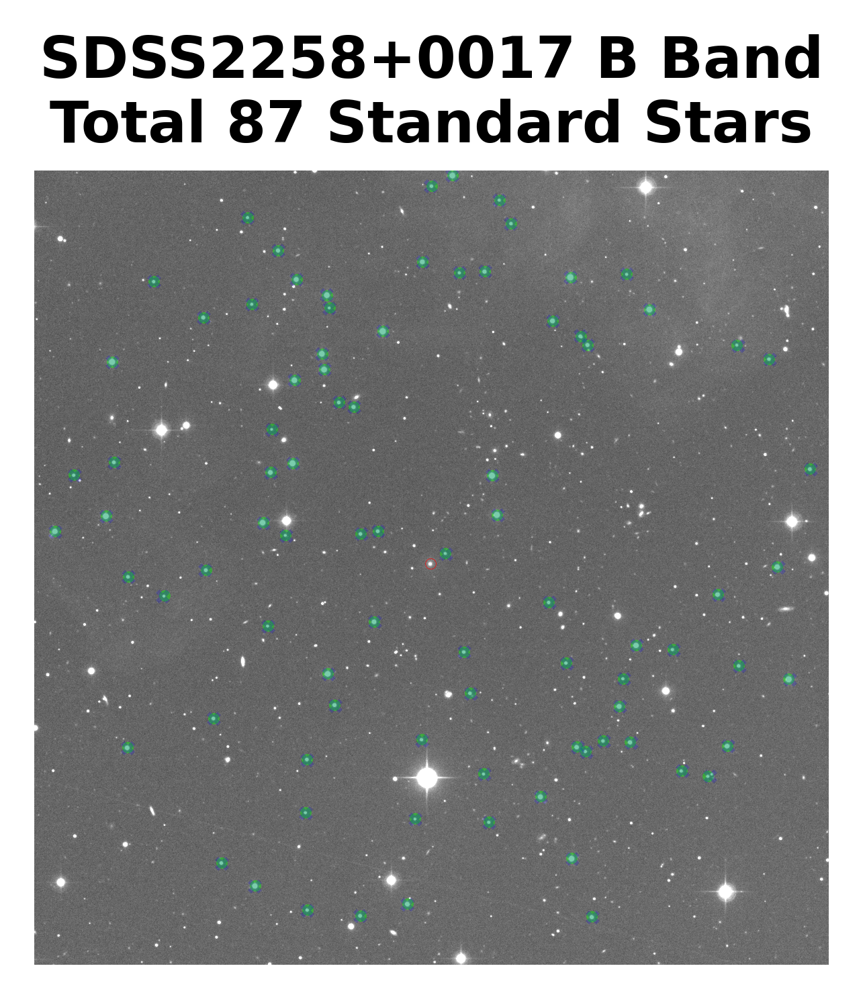

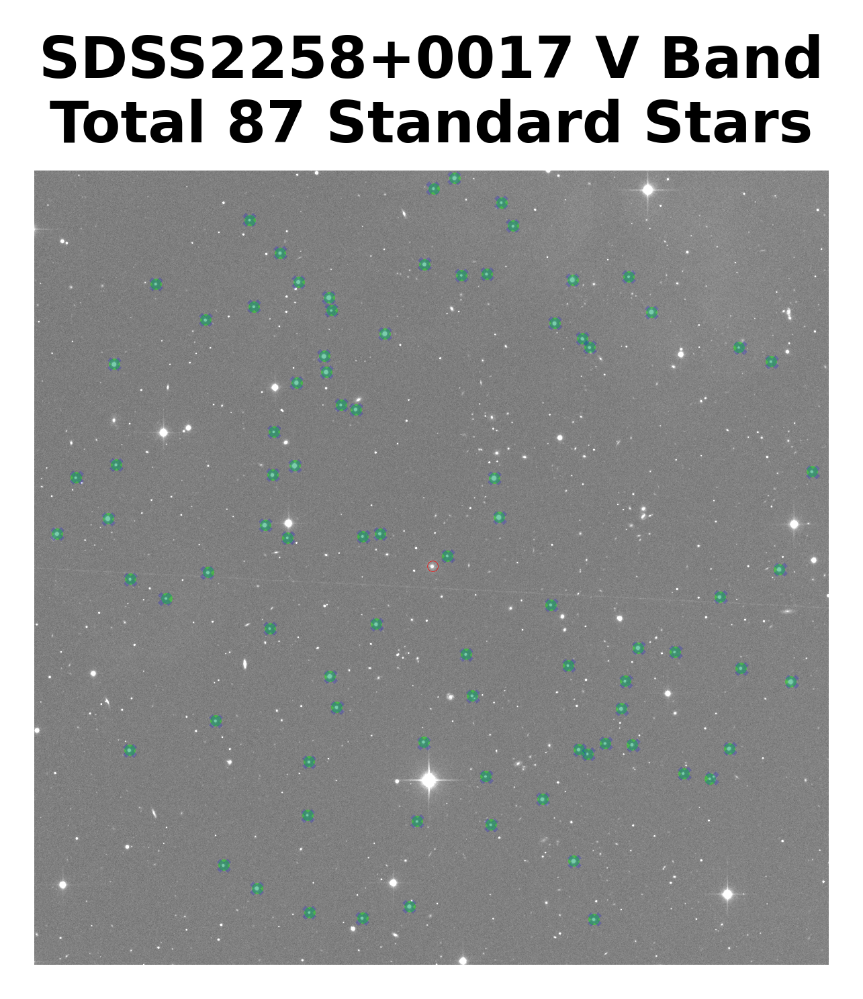

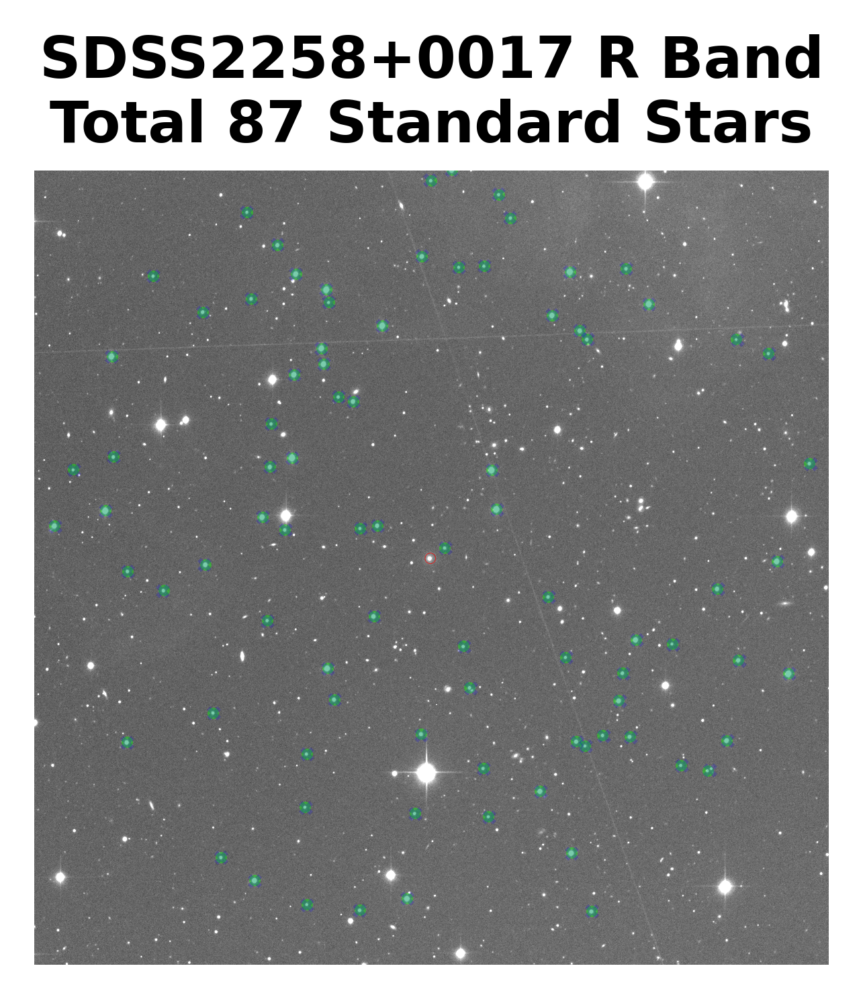

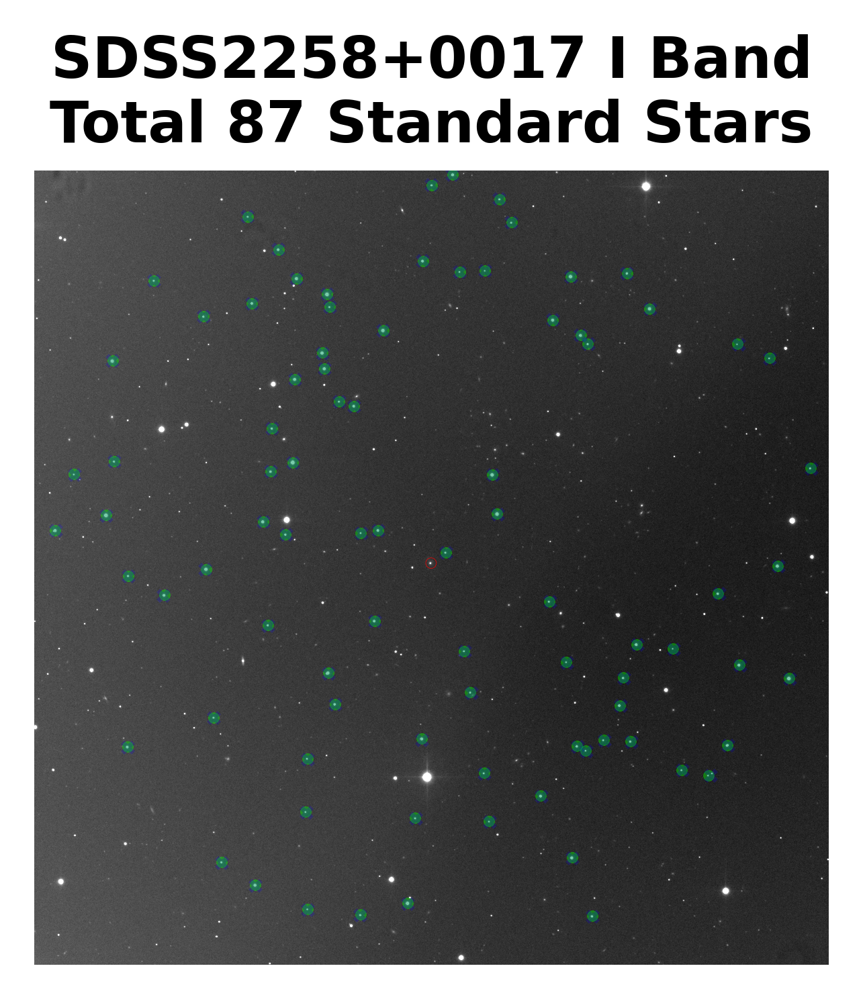

In [6]:
dpi            = 512
keep_size      = standard_star_circle_radius
save_file_path = "./photo_gallery"


for band_filter in ["B","V","R","I"]:
    v_min, v_max                = ZScaleInterval().get_limits(values=imag_data_dict[band_filter])
    object_center_pos_pixel     = imag_wcs_dict[band_filter].all_world2pix([[344.49737, 0.29520]], 0)[0]
    star_sex_pixel_x            = data_frame_sex_dict[band_filter]["X_IMAGE"]
    star_sex_pixel_y            = data_frame_sex_dict[band_filter]["Y_IMAGE"]
    star_apass_pixel_x          = star_apass_pixel_x_dict[band_filter]
    star_apass_pixel_y          = star_apass_pixel_y_dict[band_filter]
    apass_to_sex_index_map_dict = apass_to_sex_index_mapping_filter_dict[band_filter]
    
    save_fig_name               = "standard_stars_%s_snapshot_%s_band.png"%(object_name, band_filter)
    fig                         = plt.figure(figsize=(3,3), dpi=dpi)
    ax                          = plt.subplot(111)
    plot_image(ax=ax, image_array=imag_data_dict[band_filter], v_min=v_min, v_max=v_max, cmap="gray", norm_type="log", title="%s %s Band\nTotal %d Standard Stars"%(object_name,imag_header_dict[band_filter]["FILTER"], len(apass_to_sex_index_map_dict)))
    circle                      = plt.Circle((object_center_pos_pixel[0], object_center_pos_pixel[1]), 20.0, lw=0.1, color='r', fill=False)
    ax.add_patch(circle)

    ax.scatter(star_sex_pixel_x[apass_to_sex_index_map_dict.values()], star_sex_pixel_y[apass_to_sex_index_map_dict.values()], s=5.0, edgecolors=None, color="lime", marker="o", alpha=0.4, linewidths=0.1) # SEXTRACTOR stars
    ax.scatter(star_apass_pixel_x[apass_to_sex_index_map_dict.keys()], star_apass_pixel_y[apass_to_sex_index_map_dict.keys()], s=5.0, edgecolors=None, color="blue",    marker="x", alpha=0.2, linewidths=1.0) # SEXTRACTOR stars
    
    ax.set_xlim([imag_data.shape[1]//2-keep_size, imag_data.shape[1]//2+keep_size])
    ax.set_ylim([imag_data.shape[0]//2-keep_size, imag_data.shape[0]//2+keep_size])
    
    plt.savefig("%s/%s"%(save_file_path,save_fig_name), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)

In [7]:
# apass_drop_idx = [428] # drop standard star with APASS index(indices) = 428, since it(they) has(have) another star very close to them
# dpi       = 512
# keep_size = 640

# for band_filter in ["B","V","R","I"]:    
#      for drop_idx in apass_drop_idx:
#           if drop_idx in apass_to_sex_index_mapping_filter_dict[band_filter].keys():
#                del(apass_to_sex_index_mapping_filter_dict[band_filter][drop_idx])

#      v_min, v_max                = ZScaleInterval().get_limits(values=imag_data_dict[band_filter])
#      object_center_pos_pixel     = imag_wcs_dict[band_filter].all_world2pix([[344.49737, 0.29520]], 0)[0]
#      star_sex_pixel_x            = data_frame_sex_dict[band_filter]["X_IMAGE"]
#      star_sex_pixel_y            = data_frame_sex_dict[band_filter]["Y_IMAGE"]
#      star_apass_pixel_x          = star_apass_pixel_x_dict[band_filter]
#      star_apass_pixel_y          = star_apass_pixel_y_dict[band_filter]
#      apass_to_sex_index_map_dict = apass_to_sex_index_mapping_filter_dict[band_filter]
    
#      fig       = plt.figure(figsize=(3,3), dpi=dpi)
#      ax        = plt.subplot(111)
#      plot_image(ax=ax, image_array=imag_data_dict[band_filter], v_min=v_min, v_max=v_max, cmap="gray", norm_type="log", title="SDSS2258+0017 %s Band\nTotal %d Standard Stars"%(imag_header_dict[band_filter]["FILTER"], len(apass_to_sex_index_map_dict)))
#      circle    = plt.Circle((object_center_pos_pixel[0], object_center_pos_pixel[1]), 20.0, lw=0.1, color='r', fill=False)
#      ax.add_patch(circle)

#      ax.scatter(star_sex_pixel_x[apass_to_sex_index_map_dict.values()], star_sex_pixel_y[apass_to_sex_index_map_dict.values()], s=5.0, edgecolors=None, color="lime", marker="o", alpha=0.8, linewidths=0.1) # SEXTRACTOR stars
#      ax.scatter(star_apass_pixel_x[apass_to_sex_index_map_dict.keys()], star_apass_pixel_y[apass_to_sex_index_map_dict.keys()], s=5.0, edgecolors=None, color="blue",    marker="x", alpha=0.4, linewidths=1.0) # SEXTRACTOR stars
    
#      ax.set_xlim([imag_data.shape[1]//2-keep_size, imag_data.shape[1]//2+keep_size])
#      ax.set_ylim([imag_data.shape[0]//2-keep_size, imag_data.shape[0]//2+keep_size])

In [8]:
how_many_sigma                                   = 3.0
max_iter_criteria                                = 10
crop_size                                        = 80
dpi                                              = 512
aperture_max                                     = 6.0 # in unit of arcsec
n_row                                            = 18
n_col                                            = 10
save_file_path                                   = "./photo_gallery"
aperture_mask_filter_dict                        = {"B":{}, "V":{}, "R":{}, "I":{}}
aperture_pixel_count_filter_dict                 = {"B":{}, "V":{}, "R":{}, "I":{}}
brightness_sum_within_aperture_filter_dict       = {"B":{}, "V":{}, "R":{}, "I":{}}
brightness_sum_error_within_aperture_filter_dict = {"B":{}, "V":{}, "R":{}, "I":{}}

for band_filter in ["B","V","R","I"]:
    apass_to_sex_index_map_dict              = apass_to_sex_index_mapping_filter_dict[band_filter]
    imag_data                                = imag_data_dict[band_filter]
    star_sex_pixel_x                         = data_frame_sex_dict[band_filter]["X_IMAGE"]
    star_sex_pixel_y                         = data_frame_sex_dict[band_filter]["Y_IMAGE"]
    pixel_angle                              = np.rad2deg(imag_header_dict[band_filter]["XPIXSZ"]*1e-3/imag_header_dict[band_filter]["FOCALLEN"])*3600.  # arcsec per pixel
    object_circle_radius_max                 = (0.5*aperture_max)/pixel_angle # convert to number of of pixel
    save_fig_name                            = "standard_stars_%s_gallery_%s_band.png"%(object_name, band_filter)
    
    # # plotting
    # v_min, v_max                             = ZScaleInterval().get_limits(values=imag_data_dict[band_filter])
    # fig, axs = plt.subplots(nrows=n_row, ncols=n_col, figsize=(15,30), dpi=dpi)
    # axs      = axs.ravel()
    # plt.subplots_adjust(wspace=0.05, hspace=0.3)
    
    for counter, apass_idx in enumerate(apass_to_sex_index_map_dict):
        sex_idx                              = apass_to_sex_index_map_dict[apass_idx]
        star_name                            = "APASS Index %d"%apass_idx
        object_center_pos_pixel              = np.array([star_sex_pixel_x[sex_idx],star_sex_pixel_y[sex_idx]])
        object_circle_radius                 = np.max((object_circle_radius_max, 4.0*data_frame_sex_dict[band_filter]["FLUX_RADIUS"][sex_idx]))  # unit in pixels; take the larger value, the latter is the half-light radius of target
        background_circle_radius             = 8.0*object_circle_radius
        
        print("%s Band Standard Star with %s ...."%(band_filter, star_name))
    
        imag_data_crop, mask_clipped, object_mask,\
        background_mask, object_crop_center_pos_pixel,\
        background_pixel_count, background_brightness_mean,\
        background_brightness_mean_error, background_brightness_std\
                                             = make_mask_and_compute_background_statistics(imag_array= imag_data, object_center_pos_pixel=object_center_pos_pixel, crop_size=crop_size, object_circle_radius=object_circle_radius, background_circle_radius=background_circle_radius, how_many_sigma=how_many_sigma, max_iter_criteria=max_iter_criteria, pixel_flux_weighted=True)

        aperture_radius_array                = np.array([object_circle_radius]) # aperture_radius_array must in type of np.array, so we convert single float value to np.array
        aperture_mask_list, aperture_pixel_count_array, brightness_sum_within_aperture_array, brightness_sum_error_within_aperture_array\
                                             = do_aperture_photometric_by_radius(imag_array=imag_data_crop, object_mask=object_mask, aperture_radius_array=aperture_radius_array, object_center_pos=object_crop_center_pos_pixel, background_brightness_mean=background_brightness_mean, background_brightness_mean_error=background_brightness_mean_error, background_brightness_std=background_brightness_std, verbose=True)
        
        print("\tFLUX_AUTO by SEXTRACTOR is %.4e ± %.4e UNIT"%(data_frame_sex_dict[band_filter]["FLUX_AUTO"][sex_idx], data_frame_sex_dict[band_filter]["FLUXERR_AUTO"][sex_idx]))
        print("----------------------------------------------------------------------------------------------------")
        
        aperture_mask_filter_dict[band_filter][apass_idx]                        = aperture_mask_list[0]                         # only one element in the array
        aperture_pixel_count_filter_dict[band_filter][apass_idx]                 = aperture_pixel_count_array[0]                 # only one element in the array
        brightness_sum_within_aperture_filter_dict[band_filter][apass_idx]       = brightness_sum_within_aperture_array[0]       # only one element in the array
        brightness_sum_error_within_aperture_filter_dict[band_filter][apass_idx] = brightness_sum_error_within_aperture_array[0] # only one element in the array

        # plotting 
    #     imag_data_crop_clipped               = imag_data_crop.copy()
    #     imag_data_crop_clipped[mask_clipped] = imag_data_crop.min()                              # plot only not-clipped part (but does not necessarily in the background mask); only for plotting purpose

    #     ax1 = axs[2*counter+0]
    #     ax2 = axs[2*counter+1]
        
    #     plot_image(image_array=imag_data_crop, ax=ax1, cmap="gray", norm_type="linear", v_min=v_min, v_max=v_max, title="")
    #     ax1.scatter(object_crop_center_pos_pixel[0], object_crop_center_pos_pixel[1], marker="*", s=5.0, edgecolors=None, c="red", alpha=0.5)
    #     ax1.set_title("Original\nAPSS Index %d"%apass_idx, fontsize=5.0, weight="bold", y=0.97)

    #     plot_image(image_array=imag_data_crop_clipped, ax=ax2, cmap="gray", norm_type="log", v_min=v_min, v_max=v_max, title="")
    #     ax2.set_title("%.1f $\mathbf{\sigma}$ + Target Clipped\nAPSS Index %d"%(how_many_sigma,apass_idx), fontsize=5.0, weight="bold", y=0.97)
    #     object_circle     = plt.Circle(object_crop_center_pos_pixel, object_circle_radius,     color="magenta", lw=0.5, ls="--", fill=False)
    #     background_circle = plt.Circle(object_crop_center_pos_pixel, background_circle_radius, color="magenta", lw=2.0, ls="--", fill=False)
    #     ax2.add_patch(object_circle)
    #     ax2.add_patch(background_circle)
    #     ax2.text(x=object_crop_center_pos_pixel[0], y=object_crop_center_pos_pixel[1]-4.0*object_circle_radius, s="Background Region", color="magenta", weight="bold", fontsize=7.5, horizontalalignment="center")
    # fig.suptitle("%s Band Image"%(imag_header_dict[band_filter]["FILTER"]), y=0.895, weight="heavy", fontsize=18.)
    # while counter < n_col*n_row:
    #     axs[counter].axis("off")
    #     counter += 1
    # plt.savefig("%s/%s"%(save_file_path,save_fig_name), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)

B Band Standard Star with APASS Index 268 ....
Aperture radius = 8.84:
	Pixel counts in the aperture mask is 244 .
	Total Brightness within the aperture mask is 4.0823e-03 ± 4.7884e-06 UNIT .
----------------------------------------------------------------------------------------------------
	FLUX_AUTO by SEXTRACTOR is 4.1562e-03 ± 2.3625e-06 UNIT
----------------------------------------------------------------------------------------------------
B Band Standard Star with APASS Index 277 ....
Aperture radius = 8.66:
	Pixel counts in the aperture mask is 237 .
	Total Brightness within the aperture mask is 4.9755e-04 ± 2.3751e-06 UNIT .
----------------------------------------------------------------------------------------------------
	FLUX_AUTO by SEXTRACTOR is 4.9140e-04 ± 1.6477e-06 UNIT
----------------------------------------------------------------------------------------------------
B Band Standard Star with APASS Index 288 ....
Aperture radius = 8.49:
	Pixel counts in the apertu

Aperture radius = 8.72:
	Pixel counts in the aperture mask is 240 .
	Total Brightness within the aperture mask is 3.1406e-04 ± 2.1600e-06 UNIT .
----------------------------------------------------------------------------------------------------
	FLUX_AUTO by SEXTRACTOR is 3.0874e-04 ± 1.6431e-06 UNIT
----------------------------------------------------------------------------------------------------
B Band Standard Star with APASS Index 382 ....
Aperture radius = 8.92:
	Pixel counts in the aperture mask is 248 .
	Total Brightness within the aperture mask is 7.3407e-04 ± 2.5964e-06 UNIT .
----------------------------------------------------------------------------------------------------
	FLUX_AUTO by SEXTRACTOR is 7.2679e-04 ± 1.7762e-06 UNIT
----------------------------------------------------------------------------------------------------
B Band Standard Star with APASS Index 384 ....
Aperture radius = 8.76:
	Pixel counts in the aperture mask is 245 .
	Total Brightness within the a

In [9]:
apss_idx_array  = np.array(list(common_apass_idx))
johnson_B_apass = data_frame_apass["Johnson_B (B)"][apss_idx_array]
johnson_V_apass = data_frame_apass["Johnson_V (V)"][apss_idx_array]
sloan_u_apass   = data_frame_apass["Sloan_u (SU)"][apss_idx_array]
sloan_g_apass   = data_frame_apass["Sloan_g (SG)"][apss_idx_array]
sloan_r_apass   = data_frame_apass["Sloan_r (SR)"][apss_idx_array]
sloan_i_apass   = data_frame_apass["Sloan_i (SI)"][apss_idx_array]
sloan_z_apass   = data_frame_apass["Sloan_z (SZ)"][apss_idx_array]

m_inst_B, m_inst_B_error  = compute_instrumental_magnitude_and_error( np.array([ brightness_sum_within_aperture_filter_dict["B"][apass_idx] for apass_idx in apss_idx_array ]),\
                                                                      np.array([ brightness_sum_error_within_aperture_filter_dict["B"][apass_idx] for apass_idx in apss_idx_array ]))
m_inst_V, m_inst_V_error  = compute_instrumental_magnitude_and_error( np.array([ brightness_sum_within_aperture_filter_dict["V"][apass_idx] for apass_idx in apss_idx_array ]),\
                                                                      np.array([ brightness_sum_error_within_aperture_filter_dict["V"][apass_idx] for apass_idx in apss_idx_array ]))
m_inst_R, m_inst_R_error  = compute_instrumental_magnitude_and_error( np.array([ brightness_sum_within_aperture_filter_dict["R"][apass_idx] for apass_idx in apss_idx_array ]),\
                                                                      np.array([ brightness_sum_error_within_aperture_filter_dict["R"][apass_idx] for apass_idx in apss_idx_array ]))
m_inst_I, m_inst_I_error  = compute_instrumental_magnitude_and_error( np.array([ brightness_sum_within_aperture_filter_dict["I"][apass_idx] for apass_idx in apss_idx_array ]),\
                                                                      np.array([ brightness_sum_error_within_aperture_filter_dict["I"][apass_idx] for apass_idx in apss_idx_array ]))

# m_inst_V        = -5.0/2.0*np.log10(np.array([ brightness_sum_within_aperture_filter_dict["V"][apass_idx] for apass_idx in apss_idx_array]))
# m_inst_R        = -5.0/2.0*np.log10(np.array([ brightness_sum_within_aperture_filter_dict["R"][apass_idx] for apass_idx in apss_idx_array]))
# m_inst_I        = -5.0/2.0*np.log10(np.array([ brightness_sum_within_aperture_filter_dict["I"][apass_idx] for apass_idx in apss_idx_array]))
# m_inst_V_error  =  5.0/(2.0*np.log(10))*(np.array([ brightness_sum_error_within_aperture_filter_dict["V"][apass_idx]/brightness_sum_within_aperture_filter_dict["V"][apass_idx] for apass_idx in apss_idx_array]))
# m_inst_R_error  =  5.0/(2.0*np.log(10))*(np.array([ brightness_sum_error_within_aperture_filter_dict["R"][apass_idx]/brightness_sum_within_aperture_filter_dict["R"][apass_idx] for apass_idx in apss_idx_array]))
# m_inst_I_error  =  5.0/(2.0*np.log(10))*(np.array([ brightness_sum_error_within_aperture_filter_dict["I"][apass_idx]/brightness_sum_within_aperture_filter_dict["I"][apass_idx] for apass_idx in apss_idx_array]))

### Use B, V band to fit for APASS Johnson B

Beta = 1.544e-01 ± 3.189e-02; Gamma = 9.744e+00 ± 2.686e-02 
Reduced chi_square = 9.963e-01


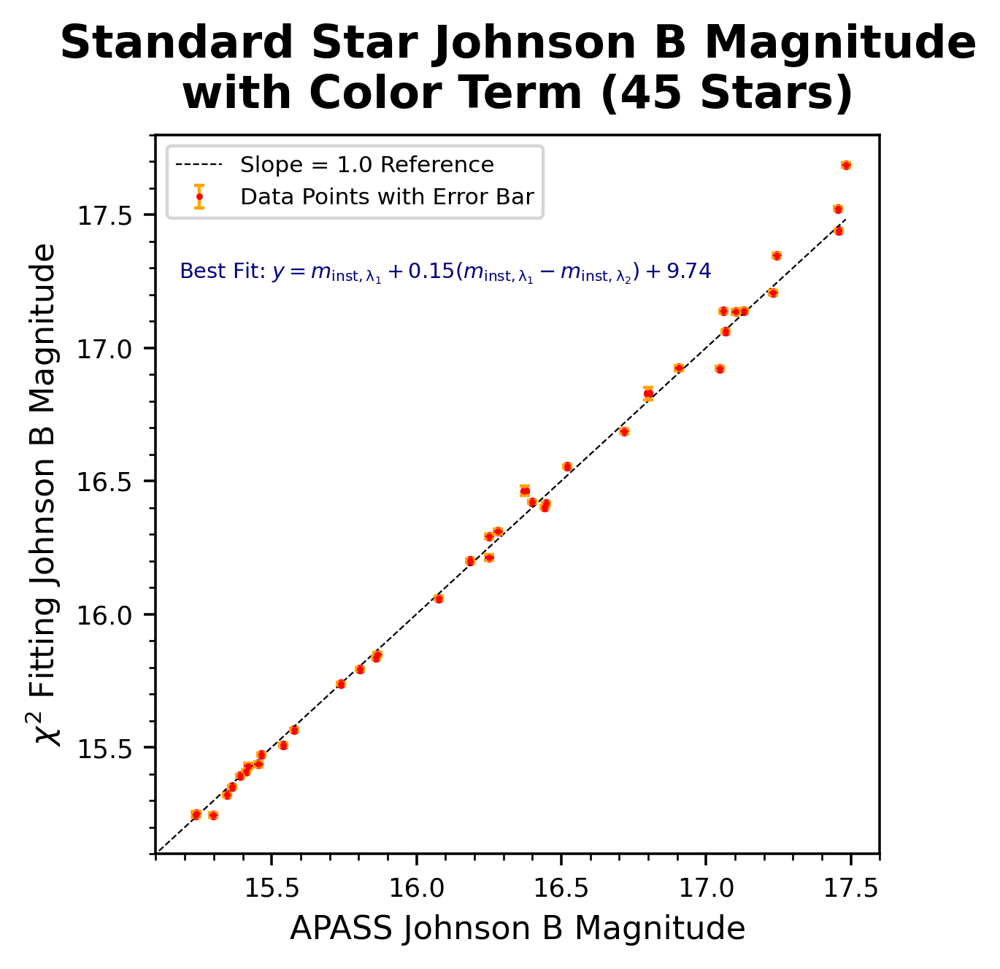

In [10]:
nan_filter              = (~johnson_B_apass.isnull()).values  # some standard stars do not have Johnson B values
magnitude_filter        = (johnson_B_apass<=17.5)                                              # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [1.0, 1.0] # beta and gamma initial guess
error_weighting         = m_inst_B_error[combined_filter]**0.5
# error_weighting         = np.ones(combined_filter.sum())
fitobj                  = kmpfit.Fitter(residuals=residual_function, data=(m_inst_B[combined_filter].astype(np.float64), m_inst_V[combined_filter].astype(np.float64), johnson_B_apass[combined_filter].values, error_weighting))
fitobj.fit(params0=params_initial_guess)

if (fitobj.status <= 0):
   print('error message =', fitobj.errmsg)
   raise RuntimeError("kmpfit failed!!")

beta_J_B, gamma_J_B             = fitobj.params[0], fitobj.params[1]
error_beta_J_B, error_gamma_J_B = fitobj.xerror[0], fitobj.xerror[1] # we use xerror (since the reduced chi square does not deviate from unit too much), so we don't use the stderr, which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
# error_beta_J_B, error_gamma_J_B = fitobj.stderr[0], fitobj.stderr[1] # we use stderr (since the reduced chi square deviates from unit too much), which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
reduced_chi_square      = fitobj.rchi2_min
print("Beta = %.3e ± %.3e; Gamma = %.3e ± %.3e "%(beta_J_B, error_beta_J_B, gamma_J_B, error_gamma_J_B))
print("Reduced chi_square = %.3e"%reduced_chi_square)


### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Johnson B"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_B_data       = m_inst_B[combined_filter]
m_inst_V_data       = m_inst_V[combined_filter]
m_inst_B_data_error = m_inst_B_error[combined_filter]
johnson_B_data      = johnson_B_apass[combined_filter]
johnson_B_pred      = color_term_fitting(m_inst_lambda1=m_inst_B_data, m_inst_lambda2=m_inst_V_data, beta=beta_J_B, gamma=gamma_J_B)
x_range             = np.linspace(johnson_B_data.min(), johnson_B_data.max(), 128)

fitting_error_bar   = np.sqrt(m_inst_B_data_error**2.0 + fitobj.covar[0,0]*(m_inst_B_data-m_inst_V_data)**2. + (m_inst_B_data-m_inst_V_data)*(fitobj.covar[0,1]+fitobj.covar[1,0]) + fitobj.covar[1,1])

ax.plot(johnson_B_data, johnson_B_pred, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(johnson_B_data, johnson_B_pred, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.8, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_J_B,gamma_J_B), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(15.0, 17.6, 0.5))
ax.set_xticklabels(np.arange(15.0, 17.6, 0.5), fontsize=8.)
ax.set_yticks(np.arange(15.0, 17.6, 0.5))
ax.set_yticklabels(np.arange(15.0, 17.6, 0.5), fontsize=8.)
ax.set_xlim([15.1, 17.6])
ax.set_ylim([15.1, 17.8])

ax.set_xlabel("APASS %s Magnitude"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color Term (%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

### Use V, R band to fit for APASS Johnson V

Beta = -2.902e-02 ± 3.849e-02; Gamma = 9.852e+00 ± 5.893e-03 
Reduced chi_square = 4.064e+00


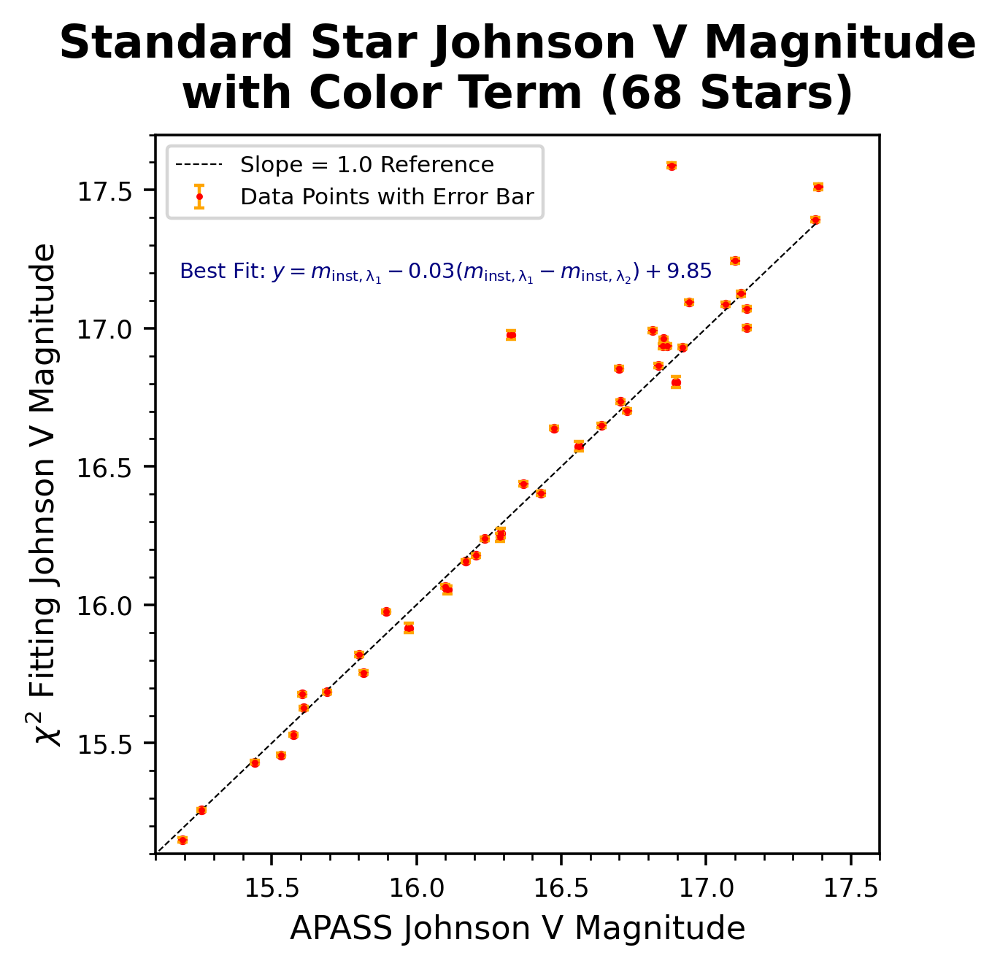

In [11]:
nan_filter              = (~johnson_V_apass.isnull()).values  # some standard stars do not have Johnson V
magnitude_filter        = (johnson_V_apass<=17.5)             # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [1.0, 1.0] # beta and gamma initial guess
error_weighting         = m_inst_V_error[combined_filter]**0.5
# error_weighting         = np.ones(combined_filter.sum())
fitobj                  = kmpfit.Fitter(residuals=residual_function, data=(m_inst_V[combined_filter].astype(np.float64), m_inst_R[combined_filter].astype(np.float64), johnson_V_apass[combined_filter].values, error_weighting))
fitobj.fit(params0=params_initial_guess)

if (fitobj.status <= 0):
   print('error message =', fitobj.errmsg)
   raise RuntimeError("kmpfit failed!!")

beta_J_V, gamma_J_V             = fitobj.params[0], fitobj.params[1]
error_beta_J_V, error_gamma_J_V = fitobj.xerror[0], fitobj.xerror[1] # we use xerror (since the reduced chi square does not deviate from unit too much), so we don't use the stderr, which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
# error_beta_J_V, error_gamma_J_V = fitobj.stderr[0], fitobj.stderr[1] # we use stderr (since the reduced chi square deviates from unit too much), which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
reduced_chi_square      = fitobj.rchi2_min
print("Beta = %.3e ± %.3e; Gamma = %.3e ± %.3e "%(beta_J_V, error_beta_J_V, gamma_J_V, error_gamma_J_V))
print("Reduced chi_square = %.3e"%reduced_chi_square)


### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Johnson V"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_V_data       = m_inst_V[combined_filter]
m_inst_R_data       = m_inst_R[combined_filter]
m_inst_V_data_error = m_inst_V_error[combined_filter]
johnson_V_data      = johnson_V_apass[combined_filter]
johnson_V_pred      = color_term_fitting(m_inst_lambda1=m_inst_V_data, m_inst_lambda2=m_inst_R_data, beta=beta_J_V, gamma=gamma_J_V)
x_range             = np.linspace(johnson_V_data.min(), johnson_V_data.max(), 128)

fitting_error_bar   = np.sqrt(m_inst_V_data_error**2.0 + fitobj.covar[0,0]*(m_inst_V_data-m_inst_R_data)**2. + (m_inst_V_data-m_inst_R_data)*(fitobj.covar[0,1]+fitobj.covar[1,0]) + fitobj.covar[1,1])

ax.plot(johnson_V_data, johnson_V_pred, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(johnson_V_data, johnson_V_pred, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.8, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_J_V,gamma_J_V), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(15.0, 17.6, 0.5))
ax.set_xticklabels(np.arange(15.0, 17.6, 0.5), fontsize=8.)
ax.set_yticks(np.arange(15.0, 17.6, 0.5))
ax.set_yticklabels(np.arange(15.0, 17.6, 0.5), fontsize=8.)
ax.set_xlim([15.1, 17.6])
ax.set_ylim([15.1, 17.7])

ax.set_xlabel("APASS %s Magnitude"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color Term (%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

### Use B, V band to fit for APASS Sloan g

Beta = -3.608e-01 ± 2.563e-02; Gamma = 9.758e+00 ± 2.221e-02 
Reduced chi_square = 5.209e-01


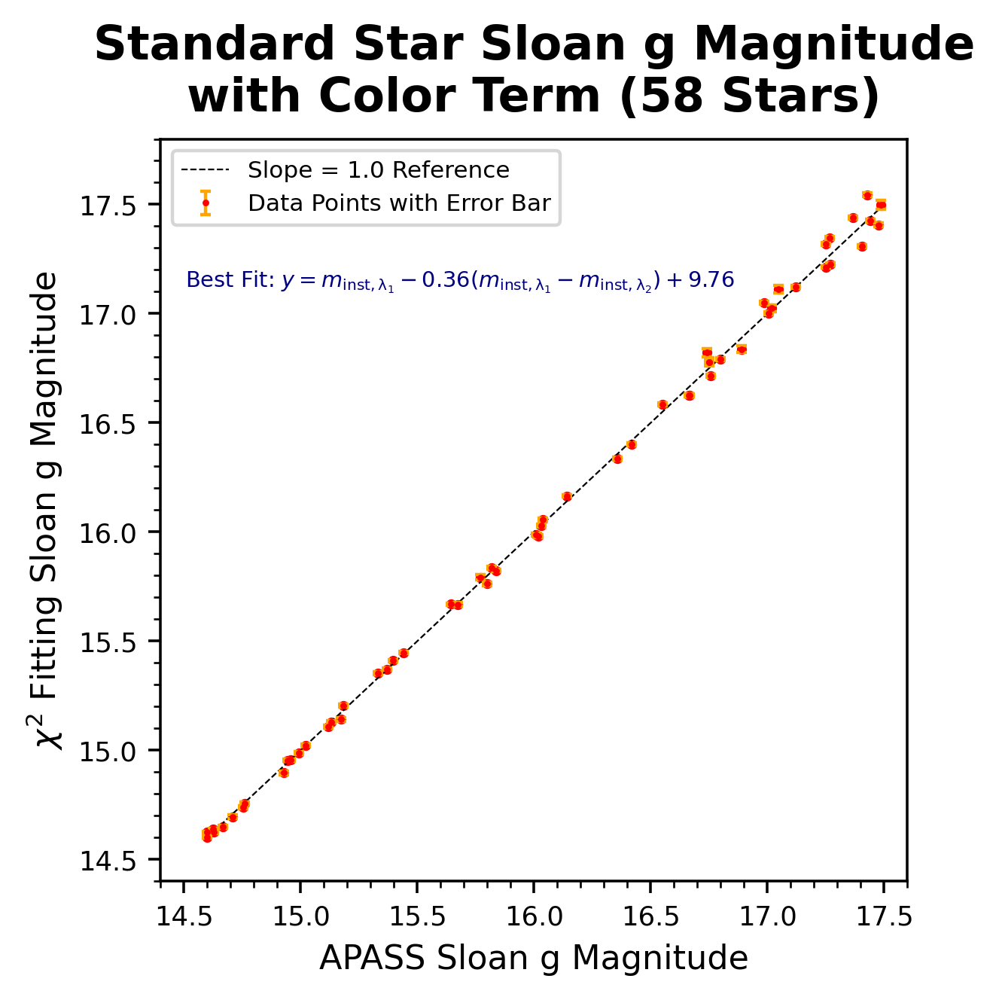

In [12]:
nan_filter              = (~sloan_g_apass.isnull()).values  # some standard stars do not have Slaon g values
magnitude_filter        = (sloan_g_apass<=17.5)             # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [1.0, 1.0] # beta and gamma initial guess
error_weighting         = m_inst_B_error[combined_filter]**0.5
# error_weighting         = np.ones(combined_filter.sum())
fitobj                  = kmpfit.Fitter(residuals=residual_function, data=(m_inst_B[combined_filter].astype(np.float64), m_inst_V[combined_filter].astype(np.float64), sloan_g_apass[combined_filter].values, error_weighting))
fitobj.fit(params0=params_initial_guess)

if (fitobj.status <= 0):
   print('error message =', fitobj.errmsg)
   raise RuntimeError("kmpfit failed!!")

beta_S_g, gamma_S_g             = fitobj.params[0], fitobj.params[1]
error_beta_S_g, error_gamma_S_g = fitobj.xerror[0], fitobj.xerror[1] # we use xerror (since the reduced chi square does not deviate from unit too much), so we don't use the stderr, which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
# error_beta_S_g, error_gamma_S_g = fitobj.stderr[0], fitobj.stderr[1] # we use stderr (since the reduced chi square deviates from unit too much), which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
reduced_chi_square      = fitobj.rchi2_min
print("Beta = %.3e ± %.3e; Gamma = %.3e ± %.3e "%(beta_S_g, error_beta_S_g, gamma_S_g, error_gamma_S_g))
print("Reduced chi_square = %.3e"%reduced_chi_square)


### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Sloan g"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_B_data       = m_inst_B[combined_filter]
m_inst_V_data       = m_inst_V[combined_filter]
m_inst_B_data_error = m_inst_B_error[combined_filter]
sloan_g_data        = sloan_g_apass[combined_filter]
sloan_g_pred        = color_term_fitting(m_inst_lambda1=m_inst_B_data, m_inst_lambda2=m_inst_V_data, beta=beta_S_g, gamma=gamma_S_g)
x_range             = np.linspace(sloan_g_data.min(), sloan_g_data.max(), 128)

fitting_error_bar   = np.sqrt(m_inst_B_data_error**2.0 + fitobj.covar[0,0]*(m_inst_B_data-m_inst_V_data)**2. + (m_inst_B_data-m_inst_V_data)*(fitobj.covar[0,1]+fitobj.covar[1,0]) + fitobj.covar[1,1])

ax.plot(sloan_g_data, sloan_g_pred, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(sloan_g_data, sloan_g_pred, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.8, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_S_g,gamma_S_g), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(14.5, 17.6, 0.5))
ax.set_xticklabels(np.arange(14.5, 17.6, 0.5), fontsize=8.)
ax.set_yticks(np.arange(14.5, 17.6, 0.5))
ax.set_yticklabels(np.arange(14.5, 17.6, 0.5), fontsize=8.)
ax.set_xlim([14.4, 17.6])
ax.set_ylim([14.4, 17.8])

ax.set_xlabel("APASS %s Magnitude"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color Term (%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

### Use R, V band to fit for APASS Sloan r

Beta = -3.418e-02 ± 3.305e-02; Gamma = 9.612e+00 ± 6.133e-03 
Reduced chi_square = 2.119e+00


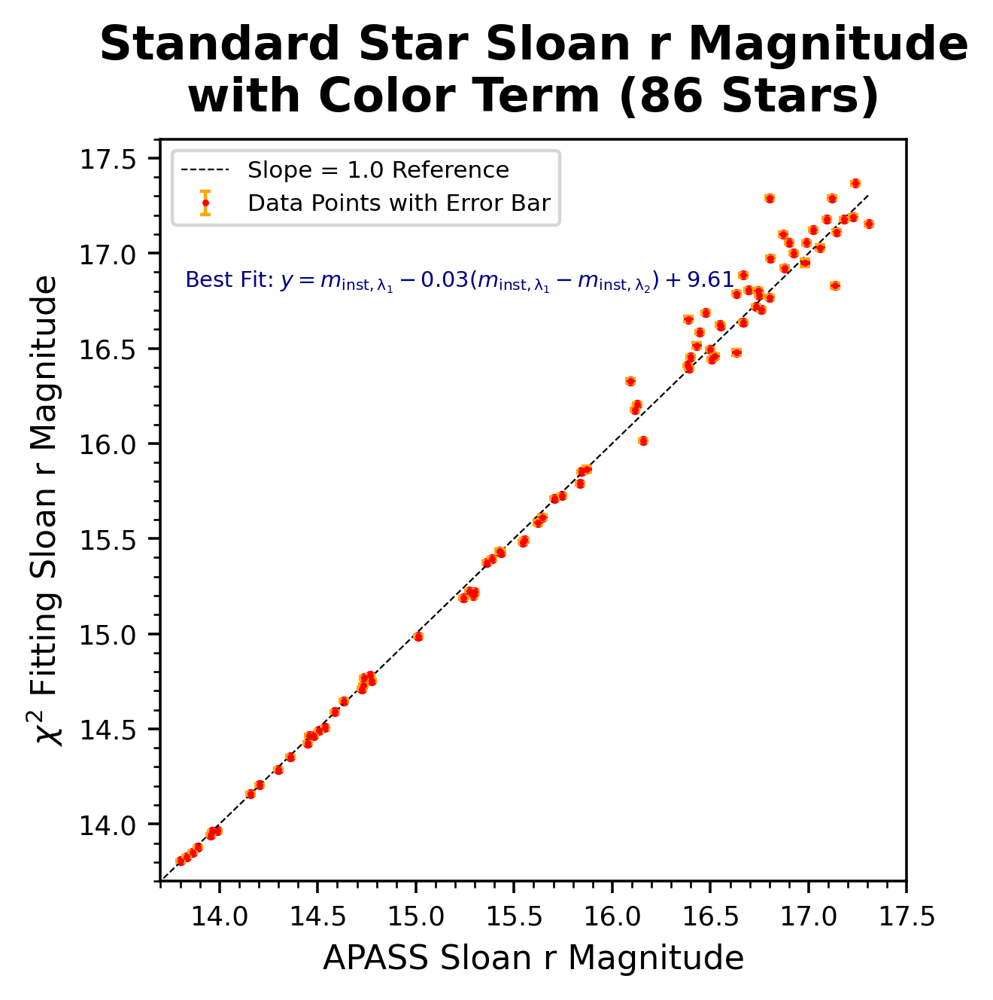

In [13]:
nan_filter              = (~sloan_r_apass.isnull()).values  # some standard stars do not have sloan r values
magnitude_filter        = (sloan_r_apass<=17.5)             # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [1.0, 1.0] # beta and gamma initial guess
error_weighting         = m_inst_R_error[combined_filter]**0.5
# error_weighting         = np.ones(combined_filter.sum())
fitobj                  = kmpfit.Fitter(residuals=residual_function, data=(m_inst_R[combined_filter].astype(np.float64), m_inst_V[combined_filter].astype(np.float64), sloan_r_apass[combined_filter].values, error_weighting))
fitobj.fit(params0=params_initial_guess)

if (fitobj.status <= 0):
   print('error message =', fitobj.errmsg)
   raise RuntimeError("kmpfit failed!!")

beta_S_r, gamma_S_r             = fitobj.params[0], fitobj.params[1]
error_beta_S_r, error_gamma_S_r = fitobj.xerror[0], fitobj.xerror[1] # we use xerror (since the reduced chi square does not deviate from unit too much), so we don't use the stderr, which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
# error_beta_S_r, error_gamma_S_r = fitobj.stderr[0], fitobj.stderr[1] # we use stderr (since the reduced chi square deviates from unit too much), which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
reduced_chi_square      = fitobj.rchi2_min
print("Beta = %.3e ± %.3e; Gamma = %.3e ± %.3e "%(beta_S_r, error_beta_S_r, gamma_S_r, error_gamma_S_r))
print("Reduced chi_square = %.3e"%reduced_chi_square)


### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Sloan r"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_R_data       = m_inst_R[combined_filter]
m_inst_V_data       = m_inst_V[combined_filter]
m_inst_R_data_error = m_inst_R_error[combined_filter]
sloan_r_data        = sloan_r_apass[combined_filter]
sloan_r_pred        = color_term_fitting(m_inst_lambda1=m_inst_R_data, m_inst_lambda2=m_inst_V_data, beta=beta_S_r, gamma=gamma_S_r)
x_range             = np.linspace(sloan_r_data.min(), sloan_r_data.max(), 128)

fitting_error_bar   = np.sqrt(m_inst_R_data_error**2.0 + fitobj.covar[0,0]*(m_inst_R_data-m_inst_V_data)**2. + (m_inst_R_data-m_inst_V_data)*(fitobj.covar[0,1]+fitobj.covar[1,0]) + fitobj.covar[1,1])

ax.plot(sloan_r_data, sloan_r_pred, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(sloan_r_data, sloan_r_pred, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.80, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_S_r,gamma_S_r), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(14.0, 17.6, 0.5))
ax.set_xticklabels(np.arange(14.0, 17.6, 0.5), fontsize=8.)
ax.set_yticks(np.arange(14.0, 17.6, 0.5))
ax.set_yticklabels(np.arange(14.0, 17.6, 0.5), fontsize=8.)
ax.set_xlim([13.7, 17.5])
ax.set_ylim([13.7, 17.6])

ax.set_xlabel("APASS %s Magnitude"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color Term (%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

### Use I, R band to fit for APASS Sloan i

Beta = -1.879e-01 ± 2.074e-02; Gamma = 8.590e+00 ± 1.832e-02 
Reduced chi_square = 3.607e+00


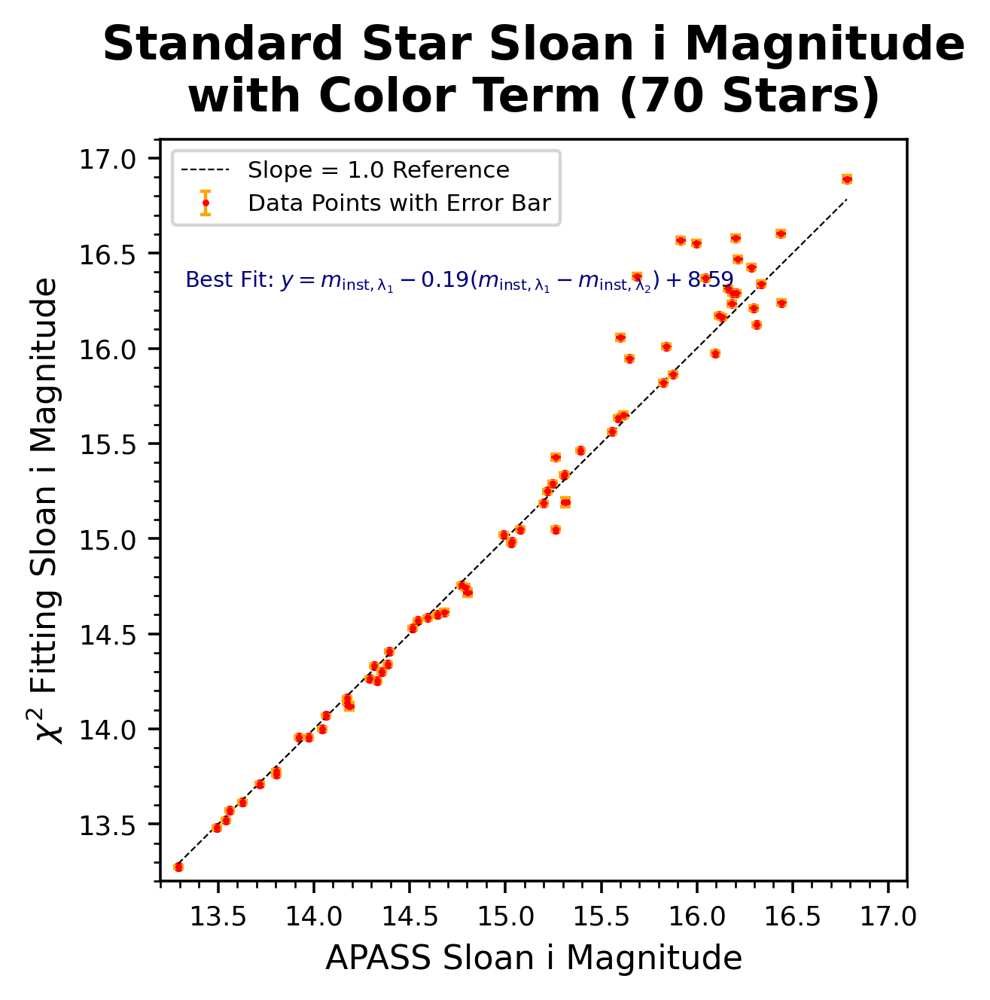

In [14]:
nan_filter              = (~sloan_i_apass.isnull()).values  # some standard stars do not have sloan i values
magnitude_filter        = (sloan_i_apass<=17.5)             # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [1.0, 1.0] # beta and gamma initial guess
error_weighting         = m_inst_I_error[combined_filter]**0.5
# error_weighting         = np.ones(combined_filter.sum())
fitobj                  = kmpfit.Fitter(residuals=residual_function, data=(m_inst_I[combined_filter].astype(np.float64), m_inst_R[combined_filter].astype(np.float64), sloan_i_apass[combined_filter].values, error_weighting))
fitobj.fit(params0=params_initial_guess)

if (fitobj.status <= 0):
   print('error message =', fitobj.errmsg)
   raise RuntimeError("kmpfit failed!!")

beta_S_i, gamma_S_i             = fitobj.params[0], fitobj.params[1]
error_beta_S_i, error_gamma_S_i = fitobj.xerror[0], fitobj.xerror[1] # we use xerror (since the reduced chi square does not deviate from unit too much), so we don't use the stderr, which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
# error_beta_S_i, error_gamma_S_i = fitobj.stderr[0], fitobj.stderr[1] # we use stderr (since the reduced chi square deviates from unit too much), which corresponding to the parameter error obtained by rescaling \sigma_i of each data point such that reduced chi square strictly equals to 1
reduced_chi_square      = fitobj.rchi2_min
print("Beta = %.3e ± %.3e; Gamma = %.3e ± %.3e "%(beta_S_i, error_beta_S_i, gamma_S_i, error_gamma_S_i))
print("Reduced chi_square = %.3e"%reduced_chi_square)


### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Sloan i"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_I_data       = m_inst_I[combined_filter]
m_inst_R_data       = m_inst_R[combined_filter]
m_inst_I_data_error = m_inst_I_error[combined_filter]
sloan_i_data        = sloan_i_apass[combined_filter]
sloan_i_pred        = color_term_fitting(m_inst_lambda1=m_inst_I_data, m_inst_lambda2=m_inst_R_data, beta=beta_S_i, gamma=gamma_S_i)
x_range             = np.linspace(sloan_i_data.min(), sloan_i_data.max(), 128)

fitting_error_bar   = np.sqrt(m_inst_I_data_error**2.0 + fitobj.covar[0,0]*(m_inst_I_data-m_inst_R_data)**2. + (m_inst_I_data-m_inst_R_data)*(fitobj.covar[0,1]+fitobj.covar[1,0]) + fitobj.covar[1,1])

ax.plot(sloan_i_data, sloan_i_pred, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(sloan_i_data, sloan_i_pred, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.80, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_S_i,gamma_S_i), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(13.0, 17.1, 0.5))
ax.set_xticklabels(np.arange(13.0, 17.1, 0.5), fontsize=8.)
ax.set_yticks(np.arange(13.0, 17.1, 0.5))
ax.set_yticklabels(np.arange(13.0, 17.1, 0.5), fontsize=8.)
ax.set_xlim([13.2, 17.1])
ax.set_ylim([13.2, 17.1])

ax.set_xlabel("APASS %s Magnitude"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color Term (%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

In [15]:
### check the influence of airmass: by assuming the Cousin R of LATTE can be converted to Sloan r of APASS, which we assume the Cousin R and Sloan r is very close

beta_C_R         = -0.13012708553166089
gamma_C_R        = 9.481808323665764
error_beta_C_R   = 0.0032361542255171915
error_gamma_C_R  = 0.002734026497842268
fitobj_covar_C_R = np.array([[1.04726942e-05, 8.50911624e-06], [8.50911624e-06, 7.47490089e-06]])

beta_C_I         = -0.027923736779617472
gamma_C_I        = 8.332688093239106
error_beta_C_I   = 0.0029014753147230087
error_gamma_C_I  = 0.0022737287561774406
fitobj_covar_C_I = np.array([[ 8.41855900e-06, -6.40034725e-06],[-6.40034725e-06,  5.16984246e-06]])

def airmass_term_fitting(m_1: np.float64, KX: np.float64) -> np.float64:
    return m_1 + KX

def residual_function_airmass(params: list, data: tuple) -> np.array:
    x, y, weight = data
    KX           = params[0]
    return ( y-airmass_term_fitting(m_1=x, KX=KX) )/weight  # Squaring will be taken by kmpfit function

### Use R, I band to fit for APASS Cousin R (approximated Cousin R by Sloan r, and take the zero correction and color term from SA114 R band fitting)

KX = 1.876e-02 ± 5.104e-03
Reduced chi_square = 2.843e+00


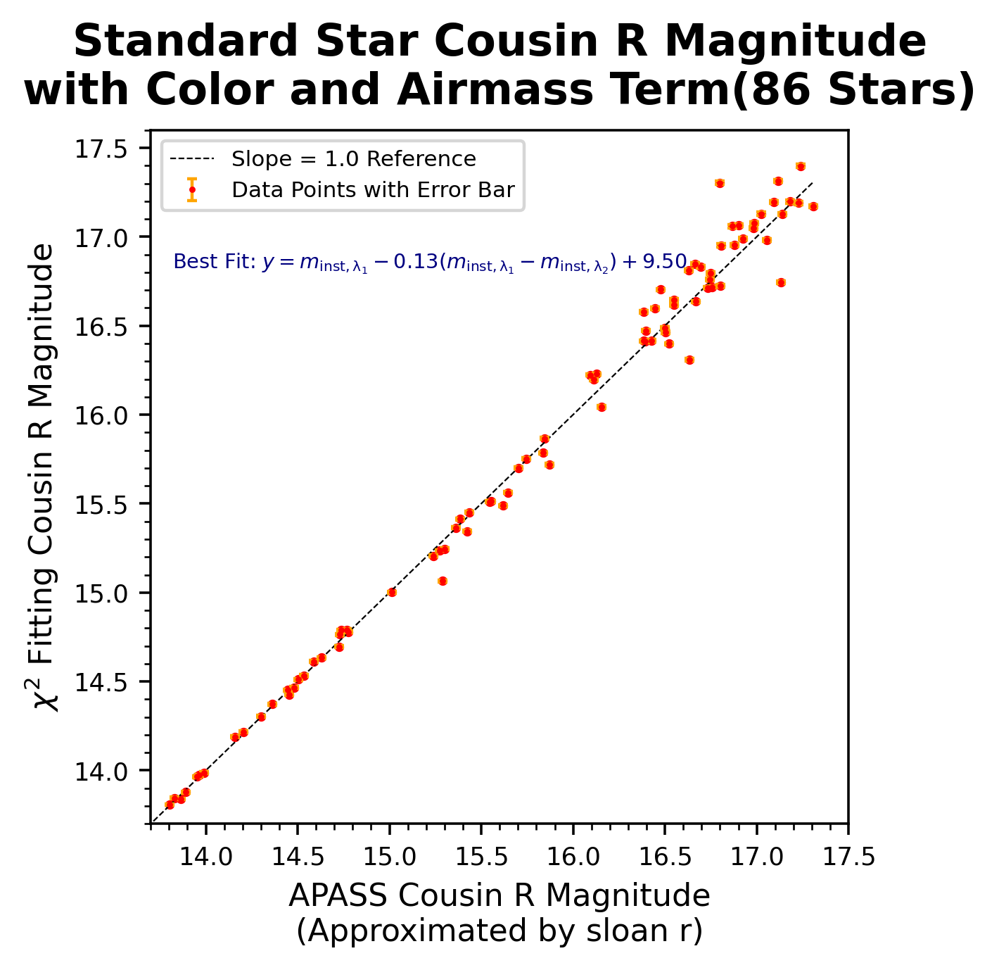

In [16]:
nan_filter              = (~sloan_r_apass.isnull()).values  # some standard stars do not have sloan r values
magnitude_filter        = (sloan_r_apass<=17.5)             # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [0.0] # airmass KX initial guess
error_weighting         = m_inst_R_error[combined_filter]**0.5

### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Cousin R"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_R_data       = m_inst_R[combined_filter]
m_inst_I_data       = m_inst_I[combined_filter]
m_inst_R_data_error = m_inst_R_error[combined_filter]
cousin_R_data       = sloan_r_apass[combined_filter] # approximate Cousin R by sloan r
cousin_R_pred       = color_term_fitting(m_inst_lambda1=m_inst_R_data, m_inst_lambda2=m_inst_I_data, beta=beta_C_R, gamma=gamma_C_R)
### chi-square fitting to find the airmass correction
fitobj              = kmpfit.Fitter(residuals=residual_function_airmass, data=(cousin_R_pred.astype(np.float64), cousin_R_data.values.astype(np.float64), error_weighting))
fitobj.fit(params0=params_initial_guess)
airmass_term_R      = fitobj.params[0]
error_airmass_R     = fitobj.xerror[0]
reduced_chi_square  = fitobj.rchi2_min
print("KX = %.3e ± %.3e"%(airmass_term_R, error_airmass_R))
print("Reduced chi_square = %.3e"%reduced_chi_square)
###
x_range             = np.linspace(cousin_R_data.min(), cousin_R_data.max(), 128)
fitting_error_bar   = np.sqrt(error_airmass_R**2.0 + m_inst_R_data_error**2.0 + fitobj_covar_C_R[0,0]*(m_inst_R_data-m_inst_I_data)**2. + (m_inst_R_data-m_inst_I_data)*(fitobj_covar_C_R[0,1]+fitobj_covar_C_R[1,0]) + fitobj_covar_C_R[1,1])

ax.plot(cousin_R_data, cousin_R_pred+airmass_term_R, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(cousin_R_data, cousin_R_pred+airmass_term_R, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.80, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_C_R,gamma_C_R+airmass_term_R), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(14.0, 17.6, 0.5))
ax.set_xticklabels(np.arange(14.0, 17.6, 0.5), fontsize=8.)
ax.set_yticks(np.arange(14.0, 17.6, 0.5))
ax.set_yticklabels(np.arange(14.0, 17.6, 0.5), fontsize=8.)
ax.set_xlim([13.7, 17.5])
ax.set_ylim([13.7, 17.6])

ax.set_xlabel("APASS %s Magnitude\n(Approximated by sloan r)"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color and Airmass Term(%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_and_airmass_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

### Use I, R band to fit for APASS Cousin I (approximated Cousin I by Sloan i, and take the zero correction and color term from SA114 I band fitting)

KX = 1.250e-01 ± 6.524e-03
Reduced chi_square = 4.417e+00


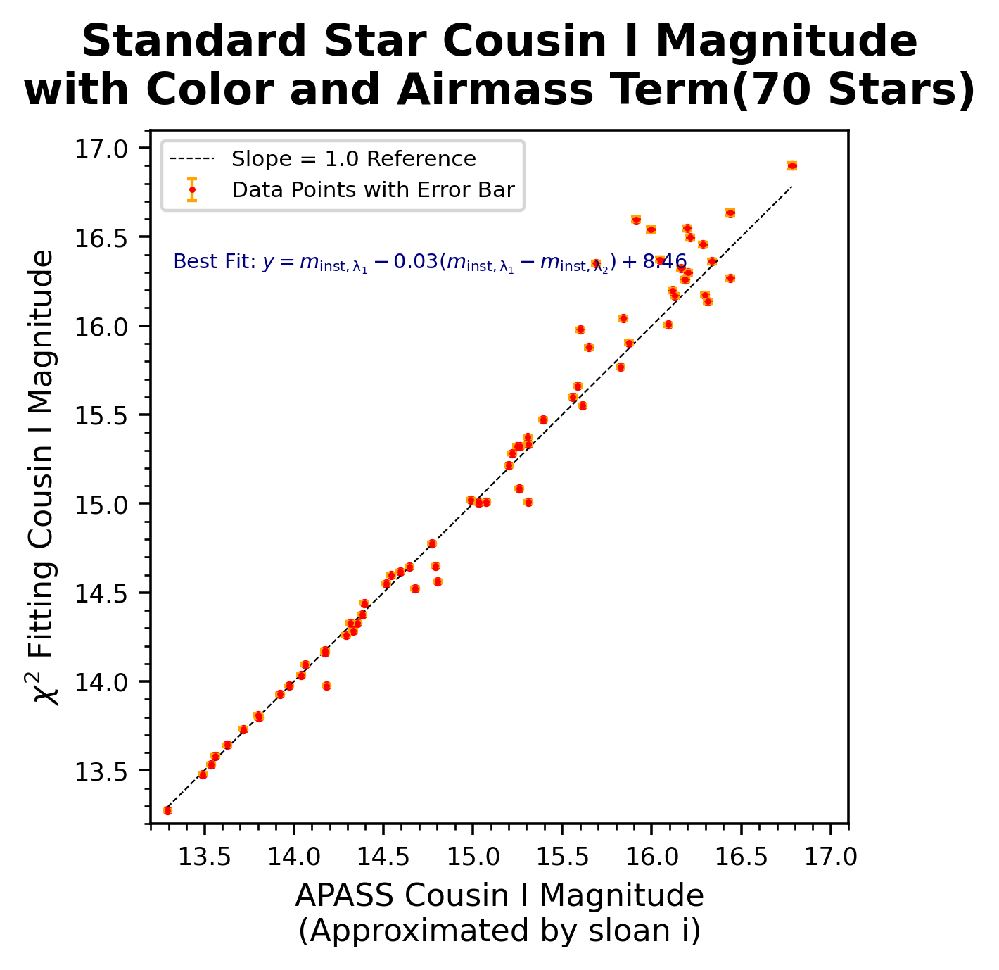

In [17]:
nan_filter              = (~sloan_i_apass.isnull()).values  # some standard stars do not have sloan r values
magnitude_filter        = (sloan_i_apass<=17.5)             # only choose bright enough sandard stars
combined_filter         = (nan_filter) & (magnitude_filter)
params_initial_guess    = [0.0] # airmass KX initial guess
error_weighting         = m_inst_I_error[combined_filter]**0.5

### plotting
dpi                 = 320
error_enlarge       = 1.0
fig                 = plt.figure(figsize=(4,4), dpi=dpi)
ax                  = plt.subplot(111)
band_filter         = "Cousin I"
save_suffix         = re.sub(" ", "_", band_filter)
save_suffix         = save_suffix[0].lower() + save_suffix[1:]
save_file_path      = "./photo_gallery"

m_inst_I_data       = m_inst_I[combined_filter]
m_inst_R_data       = m_inst_R[combined_filter]
m_inst_I_data_error = m_inst_I_error[combined_filter]
cousin_I_data       = sloan_i_apass[combined_filter] # approximate Cousin R by sloan r
cousin_I_pred       = color_term_fitting(m_inst_lambda1=m_inst_I_data, m_inst_lambda2=m_inst_R_data, beta=beta_C_I, gamma=gamma_C_I)
### chi-square fitting to find the airmass correction
fitobj              = kmpfit.Fitter(residuals=residual_function_airmass, data=(cousin_I_pred.astype(np.float64), cousin_I_data.values.astype(np.float64), error_weighting))
fitobj.fit(params0=params_initial_guess)
airmass_term_I      = fitobj.params[0]
error_airmass_I     = fitobj.xerror[0]
reduced_chi_square  = fitobj.rchi2_min
print("KX = %.3e ± %.3e"%(airmass_term_I, error_airmass_I))
print("Reduced chi_square = %.3e"%reduced_chi_square)
###
x_range             = np.linspace(cousin_I_data.min(), cousin_I_data.max(), 128)
fitting_error_bar   = np.sqrt(error_airmass_I**2.0 + m_inst_I_data_error**2.0 + fitobj_covar_C_I[0,0]*(m_inst_I_data-m_inst_R_data)**2. + (m_inst_I_data-m_inst_R_data)*(fitobj_covar_C_I[0,1]+fitobj_covar_C_I[1,0]) + fitobj_covar_C_I[1,1])

ax.plot(cousin_I_data, cousin_I_pred+airmass_term_I, color="red", marker="o", markersize=2.0, lw=0.0)
ax.plot(x_range, x_range, lw=0.5, ls="--", color="k", label="Slope = 1.0 Reference")
ax.errorbar(cousin_I_data, cousin_I_pred+airmass_term_I, fitting_error_bar,\
            lw=0.0, color='red', marker='o', markersize=1.0, capsize=1.5, mew=1.0, ls ='', label='Data Points with Error Bar', \
            ecolor='orange', elinewidth=1.0, barsabove=False)

ax.text(0.4, 0.80, "Best Fit: $y = m_{\\rm{inst},\lambda_1}%+.2f(m_{\\rm{inst},\lambda_1}-m_{\\rm{inst},\lambda_2})+%.2f$"%(beta_C_I,gamma_C_I+airmass_term_I), color="navy", fontsize=6.5, transform=ax.transAxes, horizontalalignment="center")

ax.set_xticks(np.arange(13.0, 17.1, 0.5))
ax.set_xticklabels(np.arange(13.0, 17.1, 0.5), fontsize=8.)
ax.set_yticks(np.arange(13.0, 17.1, 0.5))
ax.set_yticklabels(np.arange(13.0, 17.1, 0.5), fontsize=8.)
ax.set_xlim([13.2, 17.1])
ax.set_ylim([13.2, 17.1])

ax.set_xlabel("APASS %s Magnitude\n(Approximated by sloan i)"%(band_filter), fontsize=10.0)
ax.set_ylabel("$\chi^2$ Fitting %s Magnitude"%(band_filter), fontsize=10.0)

ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.1f"))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("Standard Star %s Magnitude\nwith Color and Airmass Term(%d Stars)"%(band_filter, combined_filter.sum()), y=1.01, fontsize=14., weight="bold")
ax.legend(loc="upper left", prop={"size": 7.0})

plt.savefig("%s/standard_star_%s_magnitude_chi_squre_fitting_with_color_term_and_airmass_%s.png"%(save_file_path,object_name,save_suffix), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)
###

In [18]:
### use max_id where total brightness is maximum
SDSS_instrumental_magnitude_data_B_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/B_band_maximum.txt")
SDSS_22580017_B_band_maximum_brightness             = SDSS_instrumental_magnitude_data_B_band[1]  # find by maximum of brightness_sum_within_aperture_array by using radius mask 
SDSS_22580017_B_band_maximum_brightness_error       = SDSS_instrumental_magnitude_data_B_band[2]

SDSS_instrumental_magnitude_data_V_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/V_band_maximum.txt")
SDSS_22580017_V_band_maximum_brightness             = SDSS_instrumental_magnitude_data_V_band[1]  # find by maximum of brightness_sum_within_aperture_array by using radius mask 
SDSS_22580017_V_band_maximum_brightness_error       = SDSS_instrumental_magnitude_data_V_band[2]

SDSS_instrumental_magnitude_data_R_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/R_band_maximum.txt")
SDSS_22580017_R_band_maximum_brightness             = SDSS_instrumental_magnitude_data_R_band[1] # find by maximum of brightness_sum_within_aperture_array by using radius mask 
SDSS_22580017_R_band_maximum_brightness_error       = SDSS_instrumental_magnitude_data_R_band[2]

SDSS_instrumental_magnitude_data_I_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/I_band_maximum.txt")
SDSS_22580017_I_band_maximum_brightness             = SDSS_instrumental_magnitude_data_I_band[1]  # find by maximum of brightness_sum_within_aperture_array by using radius mask 
SDSS_22580017_I_band_maximum_brightness_error       = SDSS_instrumental_magnitude_data_I_band[2]

m_inst_B_SDSS_22580017, m_inst_B_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_B_band_maximum_brightness, SDSS_22580017_B_band_maximum_brightness_error)
m_inst_V_SDSS_22580017, m_inst_V_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_V_band_maximum_brightness, SDSS_22580017_V_band_maximum_brightness_error)
m_inst_R_SDSS_22580017, m_inst_R_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_R_band_maximum_brightness, SDSS_22580017_R_band_maximum_brightness_error)
m_inst_I_SDSS_22580017, m_inst_I_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_I_band_maximum_brightness, SDSS_22580017_I_band_maximum_brightness_error)

# ### use saturated_id where total brightness saturated at the criteria value
# SDSS_instrumental_magnitude_data_B_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/B_band_saturated.txt")
# SDSS_22580017_B_band_saturate_brightness             = SDSS_instrumental_magnitude_data_B_band[1]  # find by saturation of brightness_sum_within_aperture_array by using radius mask 
# SDSS_22580017_B_band_saturate_brightness_error       = SDSS_instrumental_magnitude_data_B_band[2]

# SDSS_instrumental_magnitude_data_V_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/V_band_saturated.txt")
# SDSS_22580017_V_band_saturate_brightness             = SDSS_instrumental_magnitude_data_V_band[1]  # find by saturation of brightness_sum_within_aperture_array by using radius mask 
# SDSS_22580017_V_band_saturate_brightness_error       = SDSS_instrumental_magnitude_data_V_band[2]

# SDSS_instrumental_magnitude_data_R_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/R_band_saturated.txt")
# SDSS_22580017_R_band_saturate_brightness             = SDSS_instrumental_magnitude_data_R_band[1]  # find by saturation of brightness_sum_within_aperture_array by using radius mask 
# SDSS_22580017_R_band_saturate_brightness_error       = SDSS_instrumental_magnitude_data_R_band[2]

# SDSS_instrumental_magnitude_data_I_band              = np.loadtxt("./SDSS_INSTRUMENTAL_MAGNITUDE/I_band_saturated.txt")
# SDSS_22580017_I_band_saturate_brightness             = SDSS_instrumental_magnitude_data_I_band[1]  # find by saturation of brightness_sum_within_aperture_array by using radius mask 
# SDSS_22580017_I_band_saturate_brightness_error       = SDSS_instrumental_magnitude_data_I_band[2]

# m_inst_B_SDSS_22580017, m_inst_B_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_B_band_saturate_brightness, SDSS_22580017_B_band_saturate_brightness_error)
# m_inst_V_SDSS_22580017, m_inst_V_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_V_band_saturate_brightness, SDSS_22580017_V_band_saturate_brightness_error)
# m_inst_R_SDSS_22580017, m_inst_R_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_R_band_saturate_brightness, SDSS_22580017_R_band_saturate_brightness_error)
# m_inst_I_SDSS_22580017, m_inst_I_SDSS_22580017_error = compute_instrumental_magnitude_and_error(SDSS_22580017_I_band_saturate_brightness, SDSS_22580017_I_band_saturate_brightness_error)

SDSS_22580017_johnson_B_brightness_pred              = color_term_fitting(m_inst_lambda1=m_inst_B_SDSS_22580017, m_inst_lambda2=m_inst_V_SDSS_22580017,\
                                                                          beta=beta_J_B, gamma=gamma_J_B)
SDSS_22580017_johnson_V_brightness_pred              = color_term_fitting(m_inst_lambda1=m_inst_V_SDSS_22580017, m_inst_lambda2=m_inst_R_SDSS_22580017,\
                                                                          beta=beta_J_V, gamma=gamma_J_V)
SDSS_22580017_cousin_R_brightness_pred               = color_term_fitting(m_inst_lambda1=m_inst_R_SDSS_22580017, m_inst_lambda2=m_inst_I_SDSS_22580017,\
                                                                          beta=beta_C_R, gamma=gamma_C_R + airmass_term_R)
SDSS_22580017_cousin_I_brightness_pred               = color_term_fitting(m_inst_lambda1=m_inst_I_SDSS_22580017, m_inst_lambda2=m_inst_R_SDSS_22580017,\
                                                                          beta=beta_C_I, gamma=gamma_C_I + airmass_term_I)
SDSS_22580017_sloan_g_brightness_pred                = color_term_fitting(m_inst_lambda1=m_inst_B_SDSS_22580017, m_inst_lambda2=m_inst_V_SDSS_22580017,\
                                                                          beta=beta_S_g, gamma=gamma_S_g)
SDSS_22580017_sloan_r_brightness_pred                = color_term_fitting(m_inst_lambda1=m_inst_R_SDSS_22580017, m_inst_lambda2=m_inst_V_SDSS_22580017,\
                                                                          beta=beta_S_r, gamma=gamma_S_r)
SDSS_22580017_sloan_i_brightness_pred                = color_term_fitting(m_inst_lambda1=m_inst_I_SDSS_22580017, m_inst_lambda2=m_inst_R_SDSS_22580017,\
                                                                          beta=beta_S_i, gamma=gamma_S_i)

SDSS_22580017_johnson_B_brightness_pred_error        = color_term_fitting_error(m_inst_lambda1=m_inst_B_SDSS_22580017, m_inst_lambda2=m_inst_V_SDSS_22580017, beta=beta_J_B, gamma=gamma_J_B,\
                                                                                m_inst_lambda1_error=m_inst_B_SDSS_22580017_error, m_inst_lambda2_error=m_inst_V_SDSS_22580017_error, beta_error=error_beta_J_B, gamma_error=error_gamma_J_B)
SDSS_22580017_johnson_V_brightness_pred_error        = color_term_fitting_error(m_inst_lambda1=m_inst_V_SDSS_22580017, m_inst_lambda2=m_inst_R_SDSS_22580017, beta=beta_J_V, gamma=gamma_J_V,\
                                                                                m_inst_lambda1_error=m_inst_V_SDSS_22580017_error, m_inst_lambda2_error=m_inst_R_SDSS_22580017_error, beta_error=error_beta_J_V, gamma_error=error_gamma_J_V)
SDSS_22580017_cousin_R_brightness_pred_error         = color_term_fitting_error(m_inst_lambda1=m_inst_R_SDSS_22580017, m_inst_lambda2=m_inst_I_SDSS_22580017, beta=beta_C_R, gamma=gamma_C_R+airmass_term_R,\
                                                                                m_inst_lambda1_error=m_inst_R_SDSS_22580017_error, m_inst_lambda2_error=m_inst_I_SDSS_22580017_error, beta_error=error_beta_C_R, gamma_error=(error_gamma_C_R**2.0+error_airmass_R**2.0)**0.5)
SDSS_22580017_cousin_I_brightness_pred_error         = color_term_fitting_error(m_inst_lambda1=m_inst_I_SDSS_22580017, m_inst_lambda2=m_inst_R_SDSS_22580017, beta=beta_C_I, gamma=gamma_C_I+airmass_term_I,\
                                                                                m_inst_lambda1_error=m_inst_I_SDSS_22580017_error, m_inst_lambda2_error=m_inst_R_SDSS_22580017_error, beta_error=error_beta_C_I, gamma_error=(error_gamma_C_I**2.0+error_airmass_I**2.0)**0.5)
SDSS_22580017_sloan_g_brightness_pred_error          = color_term_fitting_error(m_inst_lambda1=m_inst_B_SDSS_22580017, m_inst_lambda2=m_inst_V_SDSS_22580017, beta=beta_S_g, gamma=gamma_S_g,\
                                                                                m_inst_lambda1_error=m_inst_B_SDSS_22580017_error, m_inst_lambda2_error=m_inst_V_SDSS_22580017_error, beta_error=error_beta_S_g, gamma_error=error_gamma_S_g)
SDSS_22580017_sloan_r_brightness_pred_error          = color_term_fitting_error(m_inst_lambda1=m_inst_R_SDSS_22580017, m_inst_lambda2=m_inst_V_SDSS_22580017, beta=beta_S_r, gamma=gamma_S_r,\
                                                                                m_inst_lambda1_error=m_inst_R_SDSS_22580017_error, m_inst_lambda2_error=m_inst_V_SDSS_22580017_error, beta_error=error_beta_S_r, gamma_error=error_gamma_S_r)
SDSS_22580017_sloan_i_brightness_pred_error          = color_term_fitting_error(m_inst_lambda1=m_inst_I_SDSS_22580017, m_inst_lambda2=m_inst_R_SDSS_22580017, beta=beta_S_i, gamma=gamma_S_i,\
                                                                                m_inst_lambda1_error=m_inst_I_SDSS_22580017_error, m_inst_lambda2_error=m_inst_R_SDSS_22580017_error, beta_error=error_beta_S_i, gamma_error=error_gamma_S_i)

print("Predicted SDSS22580017 Johnson B magnitude is %.4f ± %.4f"%(SDSS_22580017_johnson_B_brightness_pred, SDSS_22580017_johnson_B_brightness_pred_error))
print("Predicted SDSS22580017 Johnson V magnitude is %.4f ± %.4f"%(SDSS_22580017_johnson_V_brightness_pred, SDSS_22580017_johnson_V_brightness_pred_error))
print("Predicted SDSS22580017 Cousin R magnitude is %.4f ± %.4f"%(SDSS_22580017_cousin_R_brightness_pred, SDSS_22580017_cousin_R_brightness_pred_error))
print("Predicted SDSS22580017 Cousin I magnitude is %.4f ± %.4f"%(SDSS_22580017_cousin_I_brightness_pred, SDSS_22580017_cousin_I_brightness_pred_error))
print("Predicted SDSS22580017 Sloan g magnitude is %.4f ± %.4f" %(SDSS_22580017_sloan_g_brightness_pred, SDSS_22580017_sloan_g_brightness_pred_error))
print("Predicted SDSS22580017 Sloan r magnitude is %.4f ± %.4f" %(SDSS_22580017_sloan_r_brightness_pred, SDSS_22580017_sloan_r_brightness_pred_error))
print("Predicted SDSS22580017 Sloan i magnitude is %.4f ± %.4f" %(SDSS_22580017_sloan_i_brightness_pred, SDSS_22580017_sloan_i_brightness_pred_error))

Predicted SDSS22580017 Johnson B magnitude is 18.2840 ± 0.0299
Predicted SDSS22580017 Johnson V magnitude is 16.8497 ± 0.0145
Predicted SDSS22580017 Cousin R magnitude is 16.3753 ± 0.0114
Predicted SDSS22580017 Cousin I magnitude is 15.9575 ± 0.0251
Predicted SDSS22580017 Sloan g magnitude is 17.6130 ± 0.0265
Predicted SDSS22580017 Sloan r magnitude is 16.3975 ± 0.0111
Predicted SDSS22580017 Sloan i magnitude is 15.9708 ± 0.0307


In [19]:
from scipy.interpolate import interp1d, CubicSpline
from numpy import polyfit

def vega_magnitude_to_flux_lambda(ZP_lambda: np.float64, magnitude: np.float64) -> np.float64: 
    return 1.0e-12*10.0**((-magnitude - ZP_lambda + 8.9)/2.5) # flux in unit of erg/s/cm^2/Å

def AB_magnitude_to_flux_lambda(wavelength: np.float64, magnitude: np.float64) -> np.float64: # wavelength in unit of Å
    flux_nu =  10.0**((-magnitude + 8.9)/2.5) # flux in unit of Jy
    return 2.99792458e-05*flux_nu/wavelength**2.0    # flux in unit of erg/s/cm^2/Å

def vega_magnitude_to_flux_nu(ZP_nu: np.float64, magnitude: np.float64) -> np.float64: 
    return 10.0**((-magnitude - ZP_nu + 8.9)/2.5) # flux in unit of Jy

def AB_magnitude_to_flux_nu(magnitude: np.float64) -> np.float64: # wavelength in unit of Å
    return 10.0**((-magnitude + 8.9)/2.5) # flux in unit of Jy

def AB_flux_lambda_to_magnitude(wavelength: np.float64, flux_lambda: np.float64) -> np.float64: # wavelength in unit of Å, flux in unit of erg/s/cm^2/Å
    flux_nu = 3.33564095e4*flux_lambda*wavelength**2.0 # in unit of Jy
    return -2.5*np.log10(flux_nu) + 8.9

def magntidue_to_flux_error(flux: np.float64, magnitude_error: np.float64, ZP_error: np.float64) -> np.float64:
    return np.log(10.0)/2.5*flux*(magnitude_error**2.0 + ZP_error**2.0)**0.5

def flux_to_magnitude_error(flux: np.float64, flux_error: np.float64, ZP_error: np.float64) -> np.float64:
    return ((2.5/np.log(10.0)*(flux_error/flux))**2.0 + ZP_error**2.0)**0.5

def asinh_flux_to_magnitude(b: np.float64, f_0: np.float64, flux: np.float64) -> np.float64:
    return (-2.5)/np.log(10.0)*(np.arcsinh(flux/f_0/(2*b))+np.log(b))

def asinh_magnitude_to_flux(b: np.float64, f_0: np.float64, magnitude: np.float64) -> np.float64:
    return 2.0*b*f_0*np.sinh(magnitude/(-2.5/np.log(10.0))-np.log(b))

# def photon_z_connolly_linear(U: np.float64, B: np.float64, R: np.float64, I: np.float64) -> np.float64:
#     return -0.941 - 0.147*U + 0.412*B - 0.138*R - 0.084*I

# def phot_z_connolly_quadratic(U: np.float64, B: np.float64, R: np.float64, I: np.float64) -> np.float64:
#     return 0.396 + 0.121*U -0.099*B -0.868*R + 0.803*I - 0.346*U*B - 0.452*U*R + 0.0914*U*I + 1.256*B*R - 0.263*B*I + 0.169*R*I -0.008246*U*U - 0.636*B*B - 0.485*R*R - 0.0177*I*I

def photo_z_quadratic(U: np.float64, B: np.float64, R: np.float64, I: np.float64) -> np.float64:
    magnitude_array = np.array([U, B, R, I])
    scalar          = 0.987
    vector          = np.array([-1.239, 1.513, 2.099, -2.476])
    matrix          = np.array([[0.1168, -0.25660, -0.17239, 0.23456], [0.0, 0.16295, 0.12049, -0.23008], [0.0, 0.0, -0.22036, 0.39080], [0.0, 0.0, 0.0, -0.14324]])
    return scalar + magnitude_array@vector + magnitude_array@matrix@magnitude_array

def photo_z_quadratic_error(U: np.float64, B: np.float64, R: np.float64, I: np.float64, U_error: np.float64, B_error: np.float64, R_error: np.float64, I_error: np.float64) -> np.float64:
    # magnitude_array = np.array([U, B, R, I])
    # error_array     = np.array([U_error, B_error, R_error, I_error])
    vector          = np.array([-1.239, 1.513, 2.099, -2.476])
    matrix          = np.array([[0.1168, -0.25660, -0.17239, 0.23456], [0.0, 0.16295, 0.12049, -0.23008], [0.0, 0.0, -0.22036, 0.39080], [0.0, 0.0, 0.0, -0.14324]])
    error_from_U    = vector[0]*U_error + (matrix[0][0]+matrix[0][0])*U*U_error + (matrix[0][1]+matrix[1][0])*B*U_error + (matrix[0][2]+matrix[2][0])*R*U_error + (matrix[0][3]+matrix[3][0])*I*U_error
    error_from_B    = vector[1]*B_error + (matrix[1][0]+matrix[0][1])*U*B_error + (matrix[1][1]+matrix[1][1])*B*B_error + (matrix[1][2]+matrix[2][1])*R*B_error + (matrix[1][3]+matrix[3][1])*I*B_error
    error_from_R    = vector[2]*R_error + (matrix[2][0]+matrix[0][2])*U*R_error + (matrix[2][1]+matrix[1][2])*B*R_error + (matrix[2][2]+matrix[2][2])*R*R_error + (matrix[2][3]+matrix[3][2])*I*R_error
    error_from_I    = vector[3]*I_error + (matrix[3][0]+matrix[0][3])*U*I_error + (matrix[3][1]+matrix[1][3])*B*I_error + (matrix[3][2]+matrix[2][3])*R*I_error + (matrix[3][3]+matrix[3][3])*I*I_error
    return (error_from_U**2.0 + error_from_B**2.0 + error_from_R**2.0 + error_from_I**2.0)**0.5

In [20]:
with fits.open("./SDSS_SPECTRUM/spec-0379-51789-0624.fits") as hdul:
    spectrum_header           = hdul[1].header 
    spectrum_data             = hdul[1].data
    spectrum_column_name      = spectrum_data.names

#### Probably don't need this since the predicted Sloan asinh magnitude is very close to the preicted Sloan AB magnitude

In [21]:
# # Sloan g, r, i in AB-magnitude; see https://www.aavso.org/apass

# b_sloan_g                         = 9.0e-11
# b_sloan_r                         = 1.2e-10
# b_sloan_i                         = 1.8e-10
# f_0_sloan_g                       = 3631.0   # in unit of Jy	
# f_0_sloan_r                       = 3631.0   # in unit of Jy
# f_0_sloan_i                       = 3631.0   # in unit of Jy

# SDSS_22580017_sloan_g_flux_pred   = AB_magnitude_to_flux_nu(magnitude=SDSS_22580017_sloan_g_brightness_pred)                            # in unit of Jy
# SDSS_22580017_sloan_r_flux_pred   = AB_magnitude_to_flux_nu(magnitude=SDSS_22580017_sloan_r_brightness_pred)                            # in unit of Jy
# SDSS_22580017_sloan_i_flux_pred   = AB_magnitude_to_flux_nu(magnitude=SDSS_22580017_sloan_i_brightness_pred)                            # in unit of Jy

# SDSS_22580017_sloan_g_brightness_asinh_pred = asinh_flux_to_magnitude(b=b_sloan_g, f_0=f_0_sloan_g, flux=SDSS_22580017_sloan_g_flux_pred)
# SDSS_22580017_sloan_r_brightness_asinh_pred = asinh_flux_to_magnitude(b=b_sloan_r, f_0=f_0_sloan_r, flux=SDSS_22580017_sloan_r_flux_pred)
# SDSS_22580017_sloan_i_brightness_asinh_pred = asinh_flux_to_magnitude(b=b_sloan_i, f_0=f_0_sloan_i, flux=SDSS_22580017_sloan_i_flux_pred)

# print("Predicted SDSS22580017 Sloan g magnitude is %.4f"  %(SDSS_22580017_sloan_g_brightness_asinh_pred))
# print("Predicted SDSS22580017 Sloan r magnitude is %.4f"  %(SDSS_22580017_sloan_r_brightness_asinh_pred))
# print("Predicted SDSS22580017 Sloan i magnitude is %.4f"  %(SDSS_22580017_sloan_i_brightness_asinh_pred))

### Find the spectrum magntiude shift between the spectral data and the magntidue we predict, using the Sloan g, r, i bands

In [22]:
b_sloan_g                                   = 9.0e-11
b_sloan_r                                   = 1.2e-10
b_sloan_i                                   = 1.8e-10
f_0_sloan_g                                 = 3631.0   # in unit of Jy	
f_0_sloan_r                                 = 3631.0   # in unit of Jy
f_0_sloan_i                                 = 3631.0   # in unit of Jy
wavelength_sloan_g                          = 4670.0   # in unit of Å
wavelength_sloan_r                          = 6160.0   # in unit of Å
wavelength_sloan_i                          = 7470.0   # in unit of Å

wavelength                                  = 10.0**spectrum_data["loglam"]                            # in unit of Å
flux_density_nu                             = spectrum_data['flux']*1e-17*3.33564095e4*wavelength**2.0 # in unit of Jy

spectrum_interp_func                        = interp1d(wavelength, flux_density_nu)

SDSS_22580017_sloan_g_flux_data             = spectrum_interp_func(wavelength_sloan_g)  # in unit of Jy
SDSS_22580017_sloan_r_flux_data             = spectrum_interp_func(wavelength_sloan_r)  # in unit of Jy
SDSS_22580017_sloan_i_flux_data             = spectrum_interp_func(wavelength_sloan_i)  # in unit of Jy

SDSS_22580017_sloan_g_brightness_asinh_data = asinh_flux_to_magnitude(b=b_sloan_g, f_0=f_0_sloan_g, flux=SDSS_22580017_sloan_g_flux_data)
SDSS_22580017_sloan_r_brightness_asinh_data = asinh_flux_to_magnitude(b=b_sloan_r, f_0=f_0_sloan_r, flux=SDSS_22580017_sloan_r_flux_data)
SDSS_22580017_sloan_i_brightness_asinh_data = asinh_flux_to_magnitude(b=b_sloan_i, f_0=f_0_sloan_i, flux=SDSS_22580017_sloan_i_flux_data)

SDSS_22580017_sloan_brightness_pred_array   = np.array([SDSS_22580017_sloan_g_brightness_pred, SDSS_22580017_sloan_r_brightness_pred, SDSS_22580017_sloan_i_brightness_pred])
SDSS_22580017_sloan_brightness_asinh_data_array = np.array([SDSS_22580017_sloan_g_brightness_asinh_data, SDSS_22580017_sloan_r_brightness_asinh_data, SDSS_22580017_sloan_i_brightness_asinh_data])
error_weighting                             = np.sqrt(np.array([SDSS_22580017_sloan_g_brightness_pred_error, SDSS_22580017_sloan_r_brightness_pred_error, SDSS_22580017_sloan_i_brightness_pred_error]))

params_initial_guess                        = [1.0] # airmass KX initial guess
fitobj                                      = kmpfit.Fitter(residuals=residual_function_airmass, data=(SDSS_22580017_sloan_brightness_pred_array, SDSS_22580017_sloan_brightness_asinh_data_array, error_weighting))
fitobj.fit(params0=params_initial_guess)
sloan_spectrum_magnitude_shift              = fitobj.params[0]
error_sloan_spectrum_magnitude_shift        = fitobj.xerror[0]
reduced_chi_square                          = fitobj.rchi2_min
print("Sloan spectrum magnitude shift = %.3e ± %.3e"%(sloan_spectrum_magnitude_shift, error_sloan_spectrum_magnitude_shift))
print("Reduced chi_square = %.3e"%reduced_chi_square)

Sloan spectrum magnitude shift = 1.344e+00 ± 7.897e-02
Reduced chi_square = 1.313e-01


In [23]:
# APASS catalog has Johnson B and V in Vega magntidue, and Sloan g, r, i in AB-magnitude; see https://www.aavso.org/apass
# The Landolt standard star seems to use Vega magntiude, see: https://www.aanda.org/articles/aa/full_html/2022/08/aa43939-22/aa43939-22.html

ZP_lambda_johnson_B                     = -0.61
ZP_lambda_johnson_V                     =  0.00
ZP_lambda_cousin_R                      =  0.55
ZP_lambda_cousin_I                      =  1.27

wavelength_johnson_B                    = 4360.0 # in unit of Å
wavelength_johnson_V                    = 5450.0 # in unit of Å
wavelength_cousin_R                     = 6410.0 # in unit of Å
wavelength_cousin_I                     = 7980.0 # in unit of Å
wavelength_sloan_g                      = 4670.0 # in unit of Å
wavelength_sloan_r                      = 6160.0 # in unit of Å
wavelength_sloan_i                      = 7470.0 # in unit of Å

SDSS_22580017_johnson_B_flux_pred       = vega_magnitude_to_flux_lambda(ZP_lambda=ZP_lambda_johnson_B, magnitude=SDSS_22580017_johnson_B_brightness_pred+sloan_spectrum_magnitude_shift) # in unit of erg/s/cm^2/Å
SDSS_22580017_johnson_V_flux_pred       = vega_magnitude_to_flux_lambda(ZP_lambda=ZP_lambda_johnson_V, magnitude=SDSS_22580017_johnson_V_brightness_pred+sloan_spectrum_magnitude_shift) # in unit of erg/s/cm^2/Å
### We use Sloan-r to calibrate Cousin R for standard stars in our target FoV, so we should use AB magnitude as well for Cousin R (approximated by sloan r when doing calibration)
SDSS_22580017_cousin_R_flux_pred        = AB_magnitude_to_flux_lambda(wavelength=wavelength_cousin_R,  magnitude=SDSS_22580017_cousin_R_brightness_pred+sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
### We use Sloan-i to calibrate Cousin I for standard stars in our target FoV, so we should use AB magnitude as well for Cousin I (approximated by sloan i when doing calibration)
SDSS_22580017_cousin_I_flux_pred        = AB_magnitude_to_flux_lambda(wavelength=wavelength_cousin_I,  magnitude=SDSS_22580017_cousin_I_brightness_pred+sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_sloan_g_flux_pred         = AB_magnitude_to_flux_lambda(wavelength=wavelength_sloan_g,   magnitude=SDSS_22580017_sloan_g_brightness_pred+sloan_spectrum_magnitude_shift)   # in unit of erg/s/cm^2/Å
SDSS_22580017_sloan_r_flux_pred         = AB_magnitude_to_flux_lambda(wavelength=wavelength_sloan_r,   magnitude=SDSS_22580017_sloan_r_brightness_pred+sloan_spectrum_magnitude_shift)   # in unit of erg/s/cm^2/Å
SDSS_22580017_sloan_i_flux_pred         = AB_magnitude_to_flux_lambda(wavelength=wavelength_sloan_i,   magnitude=SDSS_22580017_sloan_i_brightness_pred+sloan_spectrum_magnitude_shift)   # in unit of erg/s/cm^2/Å

SDSS_22580017_johnson_B_flux_pred_error = magntidue_to_flux_error(flux=SDSS_22580017_johnson_B_flux_pred, magnitude_error=SDSS_22580017_johnson_B_brightness_pred_error, ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_johnson_V_flux_pred_error = magntidue_to_flux_error(flux=SDSS_22580017_johnson_V_flux_pred, magnitude_error=SDSS_22580017_johnson_V_brightness_pred_error, ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_cousin_R_flux_pred_error  = magntidue_to_flux_error(flux=SDSS_22580017_cousin_R_flux_pred,  magnitude_error=SDSS_22580017_cousin_R_brightness_pred_error,  ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_cousin_I_flux_pred_error  = magntidue_to_flux_error(flux=SDSS_22580017_cousin_I_flux_pred,  magnitude_error=SDSS_22580017_cousin_I_brightness_pred_error,  ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_sloan_g_flux_pred_error   = magntidue_to_flux_error(flux=SDSS_22580017_sloan_g_flux_pred,   magnitude_error=SDSS_22580017_sloan_g_brightness_pred_error,   ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_sloan_r_flux_pred_error   = magntidue_to_flux_error(flux=SDSS_22580017_sloan_r_flux_pred,   magnitude_error=SDSS_22580017_sloan_r_brightness_pred_error,   ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å
SDSS_22580017_sloan_i_flux_pred_error   = magntidue_to_flux_error(flux=SDSS_22580017_sloan_i_flux_pred,   magnitude_error=SDSS_22580017_sloan_i_brightness_pred_error,   ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å

SDSS_22580017_flux_pred_array           = np.array([SDSS_22580017_johnson_B_flux_pred, SDSS_22580017_johnson_V_flux_pred, SDSS_22580017_cousin_R_flux_pred, SDSS_22580017_cousin_I_flux_pred,\
                                              SDSS_22580017_sloan_g_flux_pred, SDSS_22580017_sloan_r_flux_pred, SDSS_22580017_sloan_i_flux_pred])
SDSS_22580017_flux_pred_error_array     = np.array([SDSS_22580017_johnson_B_flux_pred_error, SDSS_22580017_johnson_V_flux_pred_error, SDSS_22580017_cousin_R_flux_pred_error, SDSS_22580017_cousin_I_flux_pred_error,\
                                                   SDSS_22580017_sloan_g_flux_pred_error, SDSS_22580017_sloan_r_flux_pred_error, SDSS_22580017_sloan_i_flux_pred_error])
SDSS_22580017_wavelength_array          = np.array([wavelength_johnson_B, wavelength_johnson_V, wavelength_cousin_R, wavelength_cousin_I,\
                                                    wavelength_sloan_g, wavelength_sloan_r, wavelength_sloan_i])

In [24]:
# ### Estimate the U band flux by interpolation 
# wavelength_index_sorted                 = list(range(len(SDSS_22580017_wavelength_array)))
# wavelength_index_sorted.sort(key=lambda idx:SDSS_22580017_wavelength_array[idx])
# # CubicSpline(SDSS_22580017_wavelength_array[wavelength_index_sorted], SDSS_22580017_flux_pred_array[wavelength_index_sorted], bc_type='natural')

# wavelength_johnson_U                    = 3660 # in unit of Å
# order_p1                                = 2 # use linear fitting
# poly_coeff                              = polyfit(np.log10(SDSS_22580017_wavelength_array[wavelength_index_sorted[:order_p1]]), np.log10(SDSS_22580017_flux_pred_array[wavelength_index_sorted[:order_p1]]), deg=order_p1-1)
# SDSS_22580017_johnson_U_flux_pred       = 10.0**np.array([poly_coeff[i]*np.log10(wavelength_johnson_U)**(order_p1-i-1) for i in range(order_p1)]).sum()
# log10_johnson_B_flux_error              = 1.0/np.log(10.0)*SDSS_22580017_johnson_B_flux_pred_error/SDSS_22580017_johnson_B_flux_pred
# log10_sloan_g_flux_error                = 1.0/np.log(10.0)*SDSS_22580017_sloan_g_flux_pred_error/SDSS_22580017_sloan_g_flux_pred
# log10_johnson_U_flux_error              =  (((np.log10(wavelength_johnson_U)-np.log10(wavelength_johnson_B))/(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_B))*log10_johnson_B_flux_error)**2.0\
#                                           + ((np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_U))/(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_B))*log10_sloan_g_flux_error)**2.0)**0.5
# SDSS_22580017_johnson_U_flux_pred_error = np.log(10.0)*SDSS_22580017_johnson_V_flux_pred*log10_johnson_U_flux_error

Linear extrapolation for Johnson U flux: $\frac{y_R-y_L}{x_R-x_L}(x-x_L)+y_L = \frac{x-x_L}{x_R-x_L}y_R+\frac{x_R-x}{x_R-x_L}y_L$, where $R$ is Sloan g and $L$ is Johnson B, $x = \log_{10} \lambda$ , $y = m_{\text{AB},\lambda}$

In [25]:
ZP_nu_johnson_B                                  = -0.12

wavelength_johnson_U                             = 3660 # in unit of Å
SDSS_22580017_johnson_U_brightness_pred          =  (np.log10(wavelength_johnson_U)-np.log10(wavelength_johnson_B))/(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_B))*(SDSS_22580017_sloan_g_brightness_pred)\
                                                   +(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_U))/(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_B))*(SDSS_22580017_johnson_B_brightness_pred + ZP_nu_johnson_B) # Johnson B is in Vega magnitude, so need to be converted to AB magnitude

SDSS_22580017_johnson_U_brightness_pred_error    =  (((np.log10(wavelength_johnson_U)-np.log10(wavelength_johnson_B))/(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_B))*SDSS_22580017_sloan_g_brightness_pred_error)**2.0\
                                                   + ((np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_U))/(np.log10(wavelength_sloan_g)-np.log10(wavelength_johnson_B))*SDSS_22580017_johnson_B_brightness_pred_error)**2.0)**0.5
SDSS_22580017_johnson_U_flux_pred                = AB_magnitude_to_flux_lambda(wavelength=wavelength_johnson_U,  magnitude=SDSS_22580017_johnson_U_brightness_pred+sloan_spectrum_magnitude_shift)
SDSS_22580017_johnson_U_flux_pred_error          = magntidue_to_flux_error(flux=SDSS_22580017_johnson_U_flux_pred, magnitude_error=SDSS_22580017_johnson_U_brightness_pred_error, ZP_error=error_sloan_spectrum_magnitude_shift)  # in unit of erg/s/cm^2/Å

SDSS_22580017_johnson_U_brightness_photo_z       = SDSS_22580017_johnson_U_brightness_pred                   # already in Vega magntiude
SDSS_22580017_johnson_B_brightness_photo_z       = SDSS_22580017_johnson_B_brightness_pred + ZP_nu_johnson_B # Vega to AB magnitude
SDSS_22580017_cousin_R_brightness_photo_z        = SDSS_22580017_cousin_R_brightness_pred                    # already in Vega magntiude
SDSS_22580017_cousin_I_brightness_photo_z        = SDSS_22580017_cousin_I_brightness_pred                    # already in Vega magntiude
SDSS_22580017_johnson_U_brightness_photo_z_error = SDSS_22580017_johnson_U_brightness_pred_error
SDSS_22580017_johnson_B_brightness_photo_z_error = SDSS_22580017_johnson_B_brightness_pred_error
SDSS_22580017_cousin_R_brightness_photo_z_error  = SDSS_22580017_cousin_R_brightness_pred_error
SDSS_22580017_cousin_I_brightness_photo_z_error  = SDSS_22580017_cousin_I_brightness_pred_error

wavelength_Mg_I_5175                             = 5175 # in unit of Å
wavelength_He_II_5411                            = 5411 # in unit of Å
photo_z_Mg_lower, photo_z_Mg_upper               = wavelength_johnson_V/wavelength_Mg_I_5175 - 1.0, wavelength_sloan_r/wavelength_Mg_I_5175 - 1.0   # upper bound for photo_z by looking at the spectrum
photo_z_He_lower, photo_z_He_upper               = wavelength_johnson_V/wavelength_He_II_5411 - 1.0, wavelength_sloan_r/wavelength_He_II_5411 - 1.0 # lower  and upper bound for photon_z by looking at He II 5411 line
photo_z_lower                                    = max(photo_z_Mg_lower, photo_z_He_lower)
photo_z_upper                                    = min(photo_z_Mg_upper, photo_z_He_upper)

# Use fitting function given by https://iopscience.iop.org/article/10.1086/310674/fulltext/
photo_z_fit_quadratic_fit                        = photo_z_quadratic(U=SDSS_22580017_johnson_U_brightness_photo_z, B=SDSS_22580017_johnson_B_brightness_photo_z, R=SDSS_22580017_cousin_R_brightness_photo_z, I=SDSS_22580017_cousin_I_brightness_photo_z)
photo_z_fit_quadratic_fit_error                  = photo_z_quadratic_error(U=SDSS_22580017_johnson_U_brightness_photo_z, B=SDSS_22580017_johnson_B_brightness_photo_z, R=SDSS_22580017_cousin_R_brightness_photo_z, I=SDSS_22580017_cousin_I_brightness_photo_z,\
                                                                           U_error=SDSS_22580017_johnson_U_brightness_photo_z_error, B_error=SDSS_22580017_johnson_B_brightness_photo_z_error, R_error=SDSS_22580017_cousin_R_brightness_photo_z_error, I_error=SDSS_22580017_cousin_I_brightness_photo_z_error)

In [26]:
photo_z_lower, photo_z_upper, photo_z_fit_quadratic_fit, photo_z_fit_quadratic_fit_error

(0.0531400966183575,
 0.13842173350582154,
 0.07506825732911959,
 0.05591436243259272)

/tmp/ipykernel_158138/3895925064.py:13: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.annotate("%s"%(filter_name), (SDSS_22580017_wavelength_array[index], SDSS_22580017_flux_pred_array[index]/1e-17),\
/tmp/ipykernel_158138/3895925064.py:19: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.annotate("%s"%("Johnson U\n(Extrapolated)"), (wavelength_johnson_U, SDSS_22580017_johnson_U_flux_pred/1e-17),\


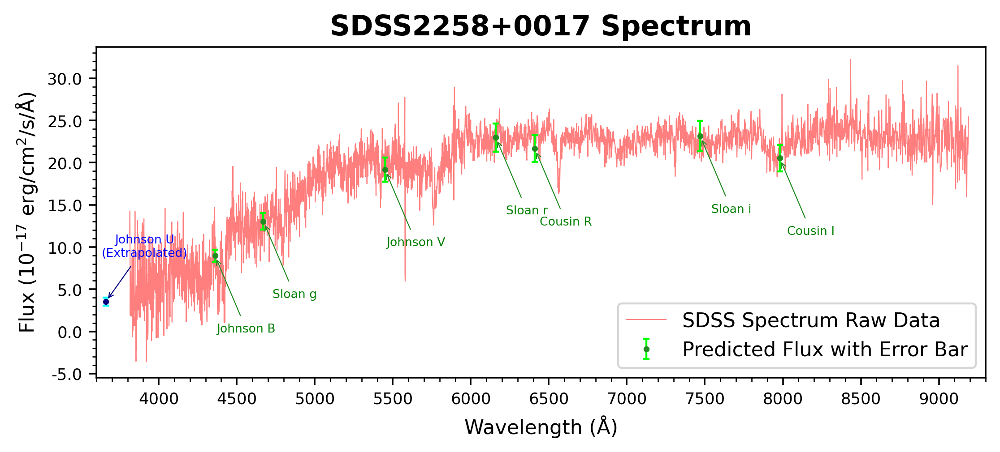

In [27]:
log_lambda     = spectrum_data["loglam"]
flux_density   = spectrum_data['flux']
save_file_path = "./photo_gallery"


fig            = plt.figure(figsize=(8,3), dpi=320)
ax             = plt.subplot(111)
ax.plot(10.**log_lambda, flux_density, color="red", label="SDSS Spectrum Raw Data", lw=0.5, alpha=0.5)
ax.errorbar(SDSS_22580017_wavelength_array, SDSS_22580017_flux_pred_array/1e-17, SDSS_22580017_flux_pred_error_array/1e-17,\
            lw=0.0, color='forestgreen', marker='o', markersize=2.0, capsize=1.5, mew=1.0, ls ='', label='Predicted Flux with Error Bar', \
            ecolor='lime', elinewidth=1.0, barsabove=False)
for index, filter_name in enumerate(["Johnson B", "Johnson V", "Cousin R", "Cousin I", "Sloan g", "Sloan r", "Sloan i"]):
    ax.annotate("%s"%(filter_name), (SDSS_22580017_wavelength_array[index], SDSS_22580017_flux_pred_array[index]/1e-17),\
                xytext=(SDSS_22580017_wavelength_array[index]+200.0, SDSS_22580017_flux_pred_array[index]/1e-17-8.),\
                color="green", fontsize=6., horizontalalignment="center", verticalalignment="top", arrowprops={"arrowstyle":"->", "lw":0.5, "facecolor":'forestgreen', "color":"forestgreen"} )
ax.errorbar(wavelength_johnson_U, SDSS_22580017_johnson_U_flux_pred/1e-17, SDSS_22580017_johnson_U_flux_pred_error/1e-17,\
            lw=0.0, color='navy', marker='o', markersize=2.0, capsize=1.5, mew=1.0, ls ='', \
            ecolor='cyan', elinewidth=1.0, barsabove=False)
ax.annotate("%s"%("Johnson U\n(Extrapolated)"), (wavelength_johnson_U, SDSS_22580017_johnson_U_flux_pred/1e-17),\
                xytext=(wavelength_johnson_U+250.0, SDSS_22580017_johnson_U_flux_pred/1e-17+8.),\
                color="blue", fontsize=6., horizontalalignment="center", verticalalignment="top", arrowprops={"arrowstyle":"->", "lw":0.5, "facecolor":'navy', "color":"navy"} )

ax.set_xlabel("Wavelength (Å)")
ax.set_ylabel("Flux ($10^{-17}\ \mathrm{erg}/\mathrm{cm}^2/\mathrm{s}/\mathrm{\AA}$)")

ax.set_xticks(np.arange(4000.0, 9100.0, 500.0))
ax.set_xticklabels(np.arange(4000.0, 9100.0, 500.0), fontsize=8.)
ax.set_yticks(np.arange(-5.0, 30.1, 5.0))
ax.set_yticklabels(np.arange(-5.0, 30.1, 5.0), fontsize=8.)
ax.set_xlim([3600.0, 9300.0])
ax.set_ylim([-5.5, 33.7])

ax.xaxis.set_minor_locator(MultipleLocator(100.0))
ax.xaxis.set_major_formatter(FormatStrFormatter("%.0f"))
ax.yaxis.set_minor_locator(MultipleLocator(1.0))
ax.yaxis.set_major_formatter(FormatStrFormatter("%.1f"))

ax.set_title("%s Spectrum"%(object_name), fontsize=14.0, weight="bold")
ax.legend(loc="lower right", prop={"size":10.0})
plt.savefig("%s/%s_spectrum_comparison_measured_vs_SDSS_spectrum.png"%(save_file_path,object_name), bbox_inches='tight', dpi=dpi, pad_inches=0.02, facecolor='white', transparent=True)

In [28]:
# actually we do have our target as an standard star in APASS catalog, with APASS index = 452 (we can set object_circle_radius=0.0 and standard_star_circle_radius=50.0 in both FIND_SS_FROM_SEXTRACTOR_CATALOG and FIND_SS_FROM_APASS_CATALOG, with the star_sex_criteria set to 0 in FIND_SS_FROM_SEXTRACTOR_CATALOG)
target_apass_index                           = 452
SDSS_22580017_johnson_B_brightness_reference = data_frame_apass["Johnson_B (B)"][target_apass_index]
SDSS_22580017_johnson_V_brightness_reference = data_frame_apass["Johnson_V (V)"][target_apass_index]
SDSS_22580017_sloan_g_brightness_reference   = data_frame_apass["Sloan_g (SG)"][target_apass_index]
SDSS_22580017_sloan_r_brightness_reference   = data_frame_apass["Sloan_r (SR)"][target_apass_index]
SDSS_22580017_sloan_i_brightness_reference   = data_frame_apass["Sloan_i (SI)"][target_apass_index]

print("APASS reference SDSS22580017 Johnson B magnitude is %.4f"%(SDSS_22580017_johnson_B_brightness_reference))
print("APASS reference SDSS22580017 Johnson V magnitude is %.4f"%(SDSS_22580017_johnson_V_brightness_reference))
print("APASS reference SDSS22580017 Sloan g magnitude is %.4f"  %(SDSS_22580017_sloan_g_brightness_reference))
print("APASS reference SDSS22580017 Sloan r magnitude is %.4f"  %(SDSS_22580017_sloan_r_brightness_reference))
print("APASS reference SDSS22580017 Sloan i magnitude is %.4f"  %(SDSS_22580017_sloan_i_brightness_reference))

APASS reference SDSS22580017 Johnson B magnitude is nan
APASS reference SDSS22580017 Johnson V magnitude is nan
APASS reference SDSS22580017 Sloan g magnitude is 17.6690
APASS reference SDSS22580017 Sloan r magnitude is 16.6260
APASS reference SDSS22580017 Sloan i magnitude is 15.7630
